# Рынок заведений общественного питания Москвы

### Описание проекта

<b> Контекст исследования:</b>
    


Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<b> Цель исследования: </b>

Определить особенности рынка общественного питания Москвы и презентовать полученные результаты, которые помогут в выборе подходящего инвесторам места.

<b> Задачи исследования: </b>

- Проанализировать типы заведений общественного питания Москвы (кафе, ресторан, пиццерия, паб или бар), определить преобладающие;
- Проанализировать расположение заведений общественного питания Москвы;
- Проанализировать особенности ценообразования в заведениях общественного питания Москвы;
- На основе полученных результатов подготовить презентацию для инвесторов, которая поможет им в принятии решения, какое заведение стоит открыть.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

<b> Описание и структура исходных данных: </b>

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Данные хранятся в датасете [/datasets/moscow_places.csv](https://code.s3.yandex.net/datasets/moscow_places.csv)

Файл moscow_places.csv содержит следующие поля:
    
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс.Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
        ◦ «Средний счёт: 1000–1500 ₽»;
        ◦ «Цена чашки капучино: 130–220 ₽»;
        ◦ «Цена бокала пива: 400–600 ₽», и так далее;
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
        ◦ Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        ◦ Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        ◦ Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
        ◦ Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        ◦ Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        ◦ Если значения нет или оно не начинается с «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.

### Первичное ознакомление с данными

Импортируем необходимые для работы библиотеки.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

#### Ознакомление с датафреймом, типы данных в столбцах

Ознакомимся с первыми строками датафрейма, а также с информацией о каждом из столбцов.

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


При первом взгляде на датафрейм мы можем отметить следующие его особенности:

  - Заголовки соответствуют форме записи snake_case и достаточно удобны для работы. Нет необходимости их изменять.
  - В датафрейме много текстовых данных, что может привести к возникновению неявных дубликатов, если одни и те же категории в категориальных переменных окажутся записаны по-разному. Необходимо будет проверить уникальность категорий.
  - В некоторых столбцах есть пропуски. Пропуски размечены как NaN, что упрощает их дальнейшую обработку.
  - Категориальная переменная chain размечена цифрами, а не текстовыми значениями. Для удобства дальнейшей работы (в частности - для удобства вывода легенды на графиках, имеющих отношение к этим данным) можно присвоить категориям текстовые значения.
  - В столбце seats данные имеют тип float, хотя логически больше подходит тип int: количество мест в заведении должно быть целым числом.

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


- Датафрейм содержит информацию о 8406 заведениях общественного питания г.Москвы.
- В отдельных столбцах датафрейма достаточно много пропусков (ниже проверим их долю). 
- Все типы данных в столбцах датафрейма, кроме float в столбце seats (что отмечено выше), логически соответствуют необходимым по смыслу.
- Отдельно стоит отметить столбец chain, где категориальная переменная размечена числовыми значениями, что мы описали выше. Для удобства дальнейшей работы категориям могут быть присвоены текстовые значения вместо числовых.

#### Доля пропусков в каждом из столбцов

Посчитаем долю пропусков в каждом из столбцов.

In [4]:
round(data.isna().sum() / data.shape[0],2)

name                 0.00
category             0.00
address              0.00
district             0.00
hours                0.06
lat                  0.00
lng                  0.00
rating               0.00
price                0.61
avg_bill             0.55
middle_avg_bill      0.63
middle_coffee_cup    0.94
chain                0.00
seats                0.43
dtype: float64

In [5]:
data.isna().mean().round(2).reset_index()

,index,0
0,name,0.00
1,category,0.00
2,address,0.00
3,district,0.00
4,hours,0.06
5,lat,0.00
6,lng,0.00
7,rating,0.00
8,price,0.61
9,avg_bill,0.55


- В 8 столбах датафрейма из 14 нет пропусков.
- В столбце hours доля пропусков относительно небольшая (6%).
- В оставшихся 5 столбцах количество пропусков значительно:
     - информация о средней стоимости чашки кофе (столбец middle_coffee_cup) неизвестна в 94% случаев;
     - информация о медиане по среднему чеку (столбец middle_avg_bill) - в 63% случаев;
     - информация о ценовой категории объекта (столбец price) - в 61% случаев;
     - информация о диапазоне среднего чека (столбец avg_bill) - в 55% случаев;
     - информация о количестве посадочных мест (столбец seats) - в 43% случаев.

В ряде случаев пропуски не являются ошибочными, и нам не требуется заполнять их или удалять соответствующие строки.  
В частности, как мы знаем из исходного описания массива данных:

- Столбец middle_coffee_cup (94% пропусков) содержит число с оценкой стоимости одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».  Вероятно, оценка заказов по стоимости чашки капучино актуальна только для 6% заведений - скорее всего, именно такое число заведений является кофейнями с узким ассортиментом. Позже проверим эту гипотезу. Заполнение пропусков или удаление строк в случае столбца middle_coffee_cup не требуется.


- Столбец middle_avg_bill (63% пропусков) содержит число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». Заполнение пропусков или удаление строк в случае столбца middle_avg_bill не требуется.


Что касается остальных столбцов с пропусками:

- Столбец price (61% пропусков), вероятно, может быть дозаполнен на основании данных в столбцах middle_coffee_cup, middle_avg_bill и avg_bill. Необходимо будет выявить закономерность, каким конкретно ценовым диапазонам присваивалась та или иная категория цен в каждом из случаев.


- Столбец avg_bill (55% пропусков) гипотетически можно было бы заполнить для сетевых заведений, если в нем есть информация хотя бы об одном заведении сети. Однако, заполняя столбец таким образом, мы исказим возможную зависимость средних цен в заведениях сети от локации и конкретного ассортимента (ассортимент иногда может слегка варьироваться). Поэтому не будем трогать данный столбец.


- Столбец seats (43% пропусков) и столбец hours (6% пропусков) мы не сможем заполнить даже по сетям, т.к. арендуемые помещения могут значительно различаться даже в рамках сети, что приводит к разнице в количестве посадочных мест, а часы работы заведений в рамках одной сети могут быть разными в зависимости от локаций.


Удалять же строки с пропусками нецелесообразно, т.к. мы потеряем большое количество данных о распределении точек общественного питания по улицам и районам.   
Оставим все столбцы с пропусками, кроме price, в том виде, в котором они есть.

#### Явные дубликаты

Проверим, есть ли в датафрейме дублирующиеся строки, и при необходимости удалим дубликаты.

In [6]:
data.duplicated().sum()

0

На данном этапе мы не обнаружили явных дубликатов, однако их наличие необходимо будет проверить еще раз, когда мы обеспечим идентичность написаний для категориальных переменных.

#### Распределение количественных переменных

Посмотрим, как распределены количественные переменные.

In [7]:
data[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()

,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,3149.000000,535.000000,4795.000000
mean,4.229895,958.053668,174.721495,108.421689
std,0.470348,1009.732845,88.951103,122.833396
min,1.000000,0.000000,60.000000,0.000000
25%,4.100000,375.000000,124.500000,40.000000
50%,4.300000,750.000000,169.000000,75.000000
75%,4.400000,1250.000000,225.000000,140.000000
max,5.000000,35000.000000,1568.000000,1288.000000


- Рейтинг точек питания варьируется от 1.0 до 5.0. Средняя оценка - 4.2, а 50% значений приходятся на оценки от 4.1 до 4.4 (второй + третий квартили). Данные по рейтингам выглядят логично. 


- В столбце middle_avg_bill (оценка среднего чека для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт») встречается нулевое значение, что выглядит как ошибка. Также очень странным выглядит максимальное значение столбца - 35000 руб. Нужно проверить, к какому заведению относится это значение. В целом столбец требует более детальной проверки и корректировки ошибочных значений. 


- Максимальное значение в столбце middle_coffee_cup (средняя стоимость чашки капучино) - 1568 руб. - выглядит достаточно большим. Нужно проверить, к какому заведению относится это значение и не является ли оно ошибочным.


- Минимальное значение количества мест в заведениях (столбец seats) -  0 мест - на первый взгляд может выглядеть сомнительно, но оно может быть характерно для заведений, работающих только на вынос. Нужно проверить, к заведениям какого типа относится это значение. Максимальное значение - 1288 мест- возможно в случае, если относится к крупным ресторанам / банкетным залам. Стоит проверить тип заведения, к которому относится это значение.

#### Вывод

Исходный датафрейм содержит информацию о 8406 заведениях общественного питания г.Москвы.

После первичного ознакомления с данными мы можем отметить следующие особенности этого датафрейма:

 - Заголовки соответствуют форме записи snake_case и достаточно удобны для работы. Нет необходимости их изменять.
 
 
 - В датафрейме много текстовых данных, что может привести к возникновению неявных дубликатов, если одни и те же категории в категориальных переменных окажутся записаны по-разному. Необходимо будет проверить уникальность категорий.
 
 
- В исходном датафрейме нет явных дубликатов, однако их наличие необходимо будет проверить еще раз, когда мы обеспечим идентичность написаний для категориальных переменных.
 
 
 - В некоторых столбцах есть пропуски. Пропуски размечены как NaN, что упрощает их дальнейшую обработку. Ниже рассмотрим информацию о пропусках более подробно.
 
 
 - Категориальная переменная chain размечена цифрами, а не текстовыми значениями. Для удобства дальнейшей работы (в частности - для удобства вывода легенды на графиках, имеющих отношение к этим данным) можно присвоить категориям текстовые значения.
 
 
 - В столбце seats данные имеют тип float, хотя логически больше подходит тип int: количество мест в заведении должно быть целым числом.
 
 
- Все типы данных в столбцах датафрейма, кроме float в столбце seats, логически соответствуют необходимым по смыслу.


Рассмотрим подробнее пропуски в датафрейме:

- В 8 столбах датафрейма из 14 нет пропусков.
- В столбце hours доля пропусков относительно небольшая (6%).
- В оставшихся 5 столбцах количество пропусков значительно:

       - информация о средней стоимости чашки кофе (столбец middle_coffee_cup) неизвестна в 94% случаев;
       - информация о медиане по среднему чеку (столбец middle_avg_bill) - в 63% случаев;
       - информация о ценовой категории объекта (столбец price) - в 61% случаев;
       - информация о диапазоне среднего чека (столбец avg_bill) - в 55% случаев;
       - информация о количестве посадочных мест (столбец seats) - в 43% случаев.


В ряде случаев пропуски не являются ошибочными, и нам не требуется заполнять их или удалять соответствующие строки.
В частности, как мы знаем из исходного описания массива данных:

- Столбец middle_coffee_cup (94% пропусков) содержит число с оценкой стоимости одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино». Вероятно, оценка заказов по стоимости чашки капучино актуальна только для 6% заведений - скорее всего, именно такое число заведений является кофейнями с узким ассортиментом. Позже проверим эту гипотезу. Заполнение пропусков или удаление строк в случае столбца middle_coffee_cup не требуется.


- Столбец middle_avg_bill (63% пропусков) содержит число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». Заполнение пропусков или удаление строк в случае столбца middle_avg_bill не требуется.

Что касается остальных столбцов с пропусками:

- Столбец price (61% пропусков), вероятно, может быть дозаполнен на основании данных в столбцах middle_coffee_cup, middle_avg_bill и avg_bill. Необходимо будет выявить закономерность, каким конкретно ценовым диапазонам присваивалась та или иная категория цен в каждом из случаев.


- Столбец avg_bill (55% пропусков) гипотетически можно было бы заполнить для сетевых заведений, если в нем есть информация хотя бы об одном заведении сети. Однако, заполняя столбец таким образом, мы исказим возможную зависимость средних цен в заведениях сети от локации и конкретного ассортимента (ассортимент иногда может слегка варьироваться). Поэтому не будем трогать данный столбец.


- Столбец seats (43% пропусков) и столбец hours (6% пропусков) мы не сможем заполнить даже по сетям, т.к. арендуемые помещения могут значительно различаться даже в рамках сети, что приводит к разнице в количестве посадочных мест, а часы работы заведений в рамках одной сети могут быть разными в зависимости от локаций.


Удалять же строки с пропусками нецелесообразно, т.к. мы потеряем большое количество данных о распределении точек общественного питания по улицам и районам.
Оставим все столбцы с пропусками, кроме price, в том виде, в котором они есть.


Что касается распределения количественных переменных датафрейма:

- Рейтинг точек питания варьируется от 1.0 до 5.0. Средняя оценка - 4.2, а 50% значений приходятся на оценки от 4.1 до 4.4 (второй + третий квартили). Данные по рейтингам выглядят логично.


- В столбце middle_avg_bill (оценка среднего чека для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт») встречается нулевое значение, что выглядит как ошибка. Также очень странным выглядит максимальное значение столбца - 35000 руб. Нужно проверить, к какому заведению относится это значение. В целом столбец требует более детальной проверки и корректировки ошибочных значений.


- Максимальное значение в столбце middle_coffee_cup (средняя стоимость чашки капучино) - 1568 руб. - выглядит достаточно большим. Нужно проверить, к какому заведению относится это значение и не является ли оно ошибочным.


- Минимальное значение количества мест в заведениях (столбец seats) - 0 мест - на первый взгляд может выглядеть сомнительно, но оно может быть характерно для заведений, работающих только на вынос. Нужно проверить, к заведениям какого типа относится это значение. Максимальное значение - 1288 мест- возможно в случае, если относится к крупным ресторанам / банкетным залам. Стоит проверить тип заведения, к которому относится это значение.

Исходя из описанных особенностей датафрейма, мы можем перейти к предобработке данных.

### Предобработка данных

#### Chain: принадлежность к сетевым заведениям

Как мы помним из описания данных, для маленьких сетей в разметке принадлежности объектов к сети могут встречаться ошибки.   
Первым шагом в ходе предобработки данных мы скорректируем этот момент.

Для начала посмотрим, точно ли в столбце chain присутствуют только 2 категории, описывающие, является или не является кафе сетевым.

In [8]:
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

Все корректно - в столбце chain представлены только 2 значения.  

Посмотрим, сколько уникальных названий сетей есть в датафрейме.  
Для этого приведем все названия к нижнему регистру, поскольку различния в регистрах могут создать неявные дубликаты.

In [9]:
data['name'] = data['name'].str.lower()

chains = 1
data.query('chain == @chains')['name'].nunique()

747

Всего в исходном датафрейме встречается 747 уникальных названий сетевых заведений общепита.

Посмотрим, как изменится это число, если мы пересчитаем количество объектов с одним и тем же названием и затем присвоим тем группам из них, для котрых число объектов больше 1, категорию сетевых: необходимо понять, сколько объектов с идентичными названиями у нас на самом деле есть.


- Подсчитаем кол-во уникальных названий различных точек общепита и составим список тех из них, значений которых в датафрейме больше 1.
- С помощью isin() отфильтруем и проставим значение в столбце chain.

In [10]:
is_chains = data['name'].value_counts()[data['name'].value_counts() > 1].index
data.loc[data['name'].isin(is_chains), 'chain'] = 1
data.query('chain == @chains')['name'].nunique()

811

Мы получили 811 уникальных названий сетевых заведений общепита.  
Ознакомимся с ними подробнее.

In [11]:
pd.options.display.max_seq_items = 1000
is_chains

Index(['кафе', 'шоколадница', 'домино'с пицца', 'додо пицца',
       'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'хинкальная',
       'шаурма', 'кофепорт', 'кулинарная лавка братьев караваевых', 'теремок',
       'чайхана', 'ресторан', 'буханка', 'cofefest', 'столовая', 'му-му',
       'drive café', 'кофемания', 'андерсон', 'крошка картошка', 'скалка',
       'french bakery', 'cinnabon', 'тануки', 'штолле', 'хлеб насущный',
       'арамье', 'vasilchukí chaihona №1', 'osteria mario', 'сушистор',
       'wild bean cafe', 'донер кебаб', 'кафетерий', 'моремания', 'мск lounge',
       'вареничная № 1', 'бургер кинг', 'правда кофе', 'pizza express 24',
       'алло! пицца', 'brasserie lambic', 'джонджоли', 'pizza hut', 'бистро',
       'кофейня', 'кафе-столовая', 'кафе-бар', 'халяль', 'bổ',
       'стейк & бургер', 'krispy kreme', 'волконский', 'даблби', 'самарканд',
       'франклинс бургер', 'phobo', 'грабли', 'пекарня', 'kuzina', 'академия',
       'буфет', 'чайхона', 'брусника'

Как мы видим, в категорию сетевых заведений на данном этапе попали, в числе прочих, заведения без конкретного названия: 'кафе', 'хинкальная', 'шаурма', и т.д.

Проставим значение несетевых таким группам заведений.

In [12]:
not_chains = (['кафе', 'хинкальная', 'шаурма', 'чайхана', 'ресторан', 'кофейня', 'столовая', 'кафетерий', 
               'халяль', 'бистро', 'кафе-столовая', 'кафе-бар', 'грузинская кухня', 'чайхона', 'буфет', 
               'пекарня', 'кофе', 'кулинария', 'чайхана халяль', 'кофе с собой', 'чайная', 'японская кухня', 
               'пельменная', 'кафе бар', 'трапезная', 'шашлычная', 'сыроварня', 'поминальные обеды', 
               'восточная кухня', 'шаверма', 'выпечка', 'пиццерия', 'пончики', 'блины', 'свежая выпечка',
               'чайхана халаль','семейная пекарня', 'кафе-кулинария', 'кафе-пекарня', 'шашлык', 'шашлыки', 
               'чебуречная', 'хинкали', 'хачапури', 'китайская кухня',
               'китайский ресторан', 'блинная', 'вьетнамская кухня', 'вьетнамское кафе'])

data.loc[data['name'].isin(not_chains), 'chain'] = 0
data.query('chain == @chains')['name'].nunique()

762

Таким образом, в датафрейме осталось 762 уникальных названия сетевых заведений общепита.  
Посмотрим, как изменилось распределение заведений на сетевые и несетевые.

In [13]:
data['chain'].value_counts()

0    5301
1    3105
Name: chain, dtype: int64

Хотя наименований сетей стало больше, пропорции сетевых и несетевых заведений в датафрейме практически не изменились. Количество сетевых заведений даже немного уменьшилось.
Вероятно, это произошло из-за того, что мы удалили из категории сетевых все заведения без конкретного названия, которые в исходном датафрейме были размечены как сетевые. 

Теперь мы можем переходить к следующему шагу - выявляению неявных дубликатов в названиях сетевых заведений.

#### Name: проверка неявных дубликатов

Как мы помним, в датафрейме есть как сетевые, так и несетевые заведения общественного питания.  
Проверим на неявные дубликаты названия сетевых объектов. Их единообразное написание потребуется для дальнейшей группировки данных по сетям.

In [16]:
data[data['chain'] == 1]['name'].sort_values().unique()

array(['1-я креветочная', '10 идеальных пицц', '18 грамм', '4 сезона',
       '7 сэндвичей', '8 вафель', '9 bar coffee', 'abc coffee roasters',
       'air coffee', 'americano black coffee & food', 'arabix',
       'arcus bar and food', 'asia gourmet', 'bakery', 'bb grill',
       'bb&burgers', 'bfl’s', 'bigсуши', 'black star burger', 'bodrero',
       'bon lavash', 'boston seafood & bar', 'bowl family',
       'brasserie lambic', 'bro&n', 'brooms', 'burger club',
       'burger heroes', 'bổ', 'cafe', 'cafe inn', 'café de paris',
       'camera obscura', 'camorra pizza e birra', 'campus',
       'carrots and beans', 'cassette cafe', 'chicha san chen', 'chicko',
       'cinnabon', 'city life', 'cofefest', 'coffee and the city',
       'coffee bean', 'coffee break', 'coffee guru', 'coffee in',
       'coffee like', 'coffee moose', 'coffee music', 'coffee party',
       'coffee point', 'coffee way', "coffeebar'17", 'coffeebrain',
       "coffeekaldi's", 'coffeeshop company', 'coffeeshots'

In [17]:
data[data['chain'] == 1]['name'].sort_values().nunique()

762

После первичных преобразований в датафрейме содержится 762 уникальных написания названий сетевых заведений общественного питания.  
Однако ряд названий имеет различные написания, хотя заведения явно относятся к одной сети, например:
- 'Яндекс Лавка' и 'Яндекс.Лавка' - различие состоит в точке в составном названии,
- 'Кондитерская-кулинария Брусника' и "Брусника" - различие состоит в полноте формулировки,
- и т.д.

Для подобных случаев составим словарь и произведем с его помощью замену на единый вариант написания.

In [18]:
# Создаем словарь с дубликатами, которые удалось найти при визуальном осмотре.
# Поиск в Яндексе во всех случаях подтвердил, что это действительно одна и та же сеть.

replace_values = ({'french bakery':'french bakery sedelice',
                   "jeffrey's coffee" : "jeffrey's coffeeshop",
                   'white fox' : 'white fox cafe',
                   'wild bean' : 'wild bean cafe', 
                   'the wild bean cafe' : 'wild bean cafe',
                   'хинкали - gали!' : 'хинкали-gали!',
                   'чайхона № 1' : 'чайхона №1',
                   'черетто море' : 'черетто',
                   'яндекс лавка' : 'яндекс.лавка',
                   'кондитерская-кулинария брусника' : "брусника",
                   'кулинариум - кулинария, пироги, салаты' : 'кулинариум',
                   'мое кафе': 'моё кафе',
                   'хлеб насущный экспресс' : 'хлеб насущный',
       })

# Создаем функцию для замены.
def multiple_replace(target_str, replace_values):
    for i, j in replace_values.items():
        target_str = target_str.replace(i, j)
    return target_str

# Производим замену.
data.loc[data['chain'] == 1, 'name'] = multiple_replace(data[data['chain'] == 1]['name'], replace_values)
data[data['chain'] == 1]['name'].nunique()

749

Итого, у нас осталось 749 уникальных названий сетевых заведений.

Перейдем к следующей категориальной переменной, и после обработки всех категориальных переменных произведем проверку на явные дубликаты еще раз.

####  Category: проверка неявных дубликатов, переименование категорий

Посмотрим, какие категории объектов присутствуют в датафрейме.

In [19]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Категории выглядят корректно, формулировки не дублируются.

Для удобства переименуем категорию "быстрое питание" в "фастфуд" - в дальнейшем короткая формулировка будет более удобна для построения графиков.

In [20]:
data['category'].replace('быстрое питание', 'фастфуд', inplace = True)
data['category'].value_counts()

кафе        2378
ресторан    2043
кофейня     1413
бар,паб      765
пиццерия     633
фастфуд      603
столовая     315
булочная     256
Name: category, dtype: int64

#### District: проверка неявных дубликатов, переименование категорий

Посмотрим, данные о каких административных округах Москвы нам доступны, и нет ли некорректных написаний названий этих округов.

In [21]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

В датафрейме есть данные о 9 административных округах старой Москвы.   
Зеленоградский, Троицкий и Новомосковский округа не включены в датафрейм.

Названия округов записаны корректно. Различных написаний одних и тех же названий нет.

Далее мы вернемся к проверке уникальности написаний категориальных переменных - в частности, столбца price.  
А пока перейдем к обработке выбросов в столбцах с количественными переменными.

#### Middle_coffee_cup: выбросы, пропуски

Как мы определили в ходе первичного ознакомления с данными, максимальное значение в столбце middle_coffee_cup (средняя стоимость чашки капучино) - 1568 руб. - выглядит чрезмерно большим. 

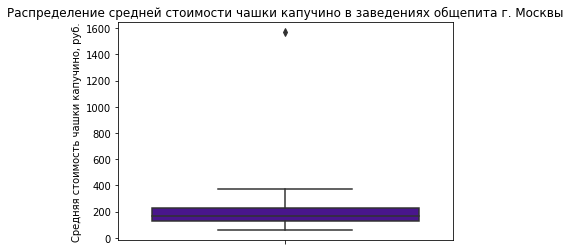

In [24]:
sns.boxplot(y='middle_coffee_cup', data=data, color = '#46039f')
plt.title('Распределение средней стоимости чашки капучино в заведениях общепита г. Москвы', fontsize=12)
plt.ylabel('Средняя стоимость чашки капучино, руб.', fontsize=10);

Как мы видим, оно действительно является единственным выбросом в данном столбце.  
Проверим, к какому заведению относится это значение, и не является ли оно ошибочным.

In [25]:
data.query('middle_coffee_cup > 500')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Для сетевой Шоколадницы средняя цена 1568.0 руб. за чашку капучино - действительно нереалистично дорого.  
На всякий случай посмотрим, какие ценовые диапазоны характерны для других объектов сети.

In [26]:
shoko = 'шоколадница'
data.query('name == @shoko').sort_values(by='middle_coffee_cup', ascending = False).head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0
1769,шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.807331,37.580716,4.1,средние,Цена чашки капучино:300–350 ₽,NaN,325.0,1,61.0
6979,шоколадница,кофейня,"Москва, улица Гарибальди, 23",Юго-Западный административный округ,"ежедневно, 09:00–22:00",55.671280,37.554501,4.1,средние,Цена чашки капучино:284–299 ₽,NaN,291.0,1,100.0
3197,шоколадница,кофейня,"Москва, площадь Победы, 1, корп. Б",Западный административный округ,"ежедневно, круглосуточно",55.735162,37.517861,4.3,средние,Цена чашки капучино:284–299 ₽,NaN,291.0,1,48.0
5076,шоколадница,кофейня,"Москва, 3-й Крутицкий переулок, 18",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.731914,37.664709,4.1,средние,Цена чашки капучино:284–299 ₽,NaN,291.0,1,100.0
941,шоколадница,кофейня,"Москва, Енисейская улица, 11",Северо-Восточный административный округ,"ежедневно, 08:00–23:00",55.865204,37.661509,4.3,NaN,Цена чашки капучино:285–289 ₽,NaN,287.0,1,40.0
6059,шоколадница,кофейня,"Москва, Ленинский проспект, 37А",Южный административный округ,"пн-пт 08:00–23:00; сб,вс 10:00–23:00",55.708471,37.587211,4.0,NaN,Цена чашки капучино:249–284 ₽,NaN,266.0,1,43.0
1928,шоколадница,кофейня,"Москва, Дмитровское шоссе, 13А",Северный административный округ,пн-пт 08:00–23:00; сб 10:00–23:00; вс 10:00–22:00,55.818321,37.573723,4.2,средние,Цена чашки капучино:249–284 ₽,NaN,266.0,1,190.0
4751,шоколадница,кофейня,"Москва, Мясницкая улица, 46, стр. 1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–20:00",55.768218,37.644498,4.2,средние,Цена чашки капучино:249–284 ₽,NaN,266.0,1,220.0
4800,шоколадница,кофейня,"Москва, Чистопрудный бульвар, 1А",Центральный административный округ,"пн-чт 08:00–23:00; пт,сб круглосуточно; вс 08:...",55.764809,37.639647,4.1,NaN,Цена чашки капучино:230–290 ₽,NaN,260.0,1,60.0


Для других объектов сети характерны средние значения в диапазоне 260-325 руб.

Очевидно, в строке 2859 есть ошибки, связанные с неверным вводом значения:

- В столбце avg_bill указан диапазон "Цена чашки капучино:230–2907 ₽", где цифра 7 в верхней границе диапазона является опечаткой, если исходить из общего уровня цен в кафе сети Шоколадница, а также, например, из строки 4800, где "Цена чашки капучино:230–290 ₽" - ровно тот диапазон, который получится в ошибочной строке 2859, если мы уберем последнюю семерку.


- В столбце middle_coffee_cup средняя цена посчитана неправильно, поскольку для ее расчета, вероятно, использовались некорректно введенные данные из столбца avg_bill.

Скорректируем данные в соответствующих ячейках.

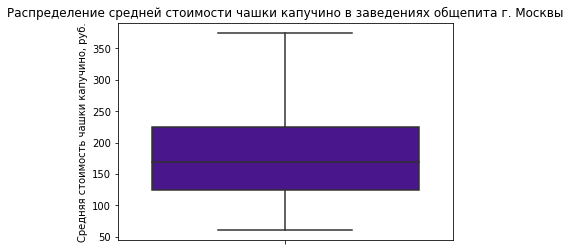

In [27]:
data['avg_bill'].replace('Цена чашки капучино:230–2907 ₽', 'Цена чашки капучино:230–290 ₽', inplace = True)

data['middle_coffee_cup'].replace(1568.0, 260.0 , inplace = True) 
# Замена на среднее между 2 крайними значениями нового диапазона. 
# Не пересчитываем среднее отдельно, поскольку оно уже указано в стороке 4800.

sns.boxplot(y='middle_coffee_cup', data=data, color = '#46039f')
plt.title('Распределение средней стоимости чашки капучино в заведениях общепита г. Москвы', fontsize=12)
plt.ylabel('Средняя стоимость чашки капучино, руб.', fontsize=10);

In [28]:
data['middle_coffee_cup'].describe()

count    535.000000
mean     172.276636
std       65.457438
min       60.000000
25%      124.500000
50%      169.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Теперь в столбце middle_coffee_cup нет выбросов, и средние расценки на чашку капучино выглядят корректными.   
Средняя стоимость чашки капучино в заведениях Москвы варьируется от 60 до 375 рублей.

Теперь проверим, можно ли заполнить часть пропусков в столбце middle_coffee_cup на основании данных столбца avg_bill.

In [29]:
cup = 'Цена чашки капучино'
data.query('middle_coffee_cup.isnull() & avg_bill.notnull() & avg_bill.str.contains(@cup)')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Мы получили пустой датафрейм. Таким образом, во всех случаях, когда в столбце avg_bill есть данные о цене чашки капучино, эта информация уже отражена в столбце middle_coffee_cup. Пропуски в столбце middle_coffee_cup не являются некорректными и не требуют заполнения.

#### Middle_avg_bill: выбросы, пропуски

Как мы определили в ходе первичного ознакомления с данными, в столбце middle_avg_bill (оценка среднего чека для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»):

- Встречается нулевое значение, что выглядит как ошибка;
- Слишком высоким выглядит максимальное значение - 35000 руб. Нужно проверить, к какому заведению оно относится. 

Посмотрим, как распределены значения столбца.

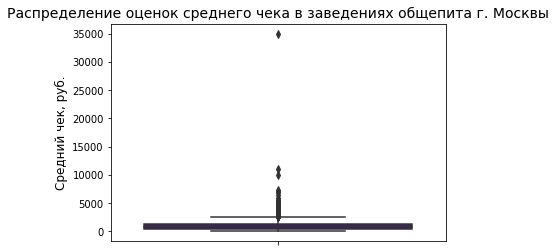

In [30]:
sns.boxplot(y='middle_avg_bill', data=data, color = '#46039f')
plt.title('Распределение оценок среднего чека в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Средний чек, руб.', fontsize=12);

Как мы видим:
  - Максимальное значение - 35000 руб. - действительно является выбросом, сильно отличающимся даже от других выбросов.
  - Также к крупным выбросам мы можем отнести еще 2 значения выше 9000 руб.
  
Рассмотрим эти строки подробнее.

In [31]:
data.query('middle_avg_bill > 9000').sort_values(by='middle_avg_bill', ascending = False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN


Поиск этих объектов в открытых источниках дает нам следующую информацию:

- Кафе по адресу Каширское шоссе, 23, стр. 2 - это La cafe на территории Онкологического научного центра им. Н.Н. Блохина: https://zoon.ru/msk/restaurants/la_cafe_na_metro_kashirskaya/. Оно не является рестораном (ошибка в category), не работает круглосуточно (ошибка в hours) и, очевидно, не может иметь такого высокого прайса, который указан в датафрейме (ошибки в price, avg_bill, middle_avg_bill). Также мы не можем быть уверенными в указанном количестве мест (seats под сомнением). Целесообразно заменить данные во всех перечисленных столбцах на NaN. При этом мы не удаляем из массива всю строку, т.к. кафе по этому адресу действительно существует - данные пригодятся нам для нанесения их на карту объектов и / или для подсчета объектов по округам / адресам.


- Чойхона по адресу Дмитровское шоссе, 95А, если судить по отзывам на сайтах ниже, является крайне недорогим заведением (ошибки в price, avg_bill, middle_avg_bill) и по формату ближе к кафе,а не к катгории бар / паб (ошибка в category):
    - https://restaurantguru.ru/Bronx-Moscow, 
    - https://2gis.ru/moscow/search/%D0%9A%D1%83%D0%B4%D0%B0%20%D1%81%D1%85%D0%BE%D0%B4%D0%B8%D1%82%D1%8C/filters/subway%3D70030076158836797/firm/70000001027509209/37.543521%2C55.871483/tab/reviews.   

  Необходимо внести в датафрейм соответствующие изменения.


- Третий объект с крайне высоким ценником - ресторан Гости - концептуальное место, где проходят мероприятия в формате шеф-тейбл. Вероятно, средний чек здесь действительно может быть достаточно высоким. Данные в соответствующей строке не нужно корректировать.

Внесем изменения в датафрейм там, где это необходимо.

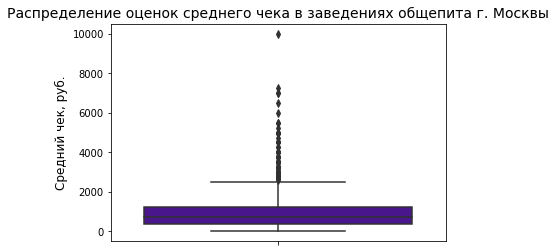

In [32]:
# Скорректируем данные в строке 7177 - Кафе по адресу Каширское шоссе, 23, стр. 2.

data.loc[7177, 'category'] = 'кафе'
data.loc[7177, ['hours', 'price', 'seats']] = np.nan

# Скорректируем данные в строке 730 - Чойхона по адресу Дмитровское шоссе, 95А.

data.loc[7177, 'category'] = 'кафе'
data.loc[730, 'price'] = "низкие"

# Скорректируем данные о среднем чеке в строках 7177 и 730

data['avg_bill'].replace(['Средний счёт:20000–50000 ₽', 'Средний счёт:5000–17000 ₽'], np.nan , inplace = True)
data['middle_avg_bill'].replace([35000.0, 11000.0] , np.nan, inplace = True) 

sns.boxplot(y='middle_avg_bill', data=data, color = '#46039f')
plt.title('Распределение оценок среднего чека в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Средний чек, руб.', fontsize=12);

В оставшемся массиве также достаточно много выбросов, но как минимум мы избавились от наиболее выбивающихся некорректных значений.

Теперь разберемся, почему как минимум в одном случае средний чек оказался равен 0.

In [33]:
data[data['middle_avg_bill'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


Вероятно, ошибка произошла при вводе данных в столбце avg_bill.   
Скорректируем соответствующие значения на NaN.

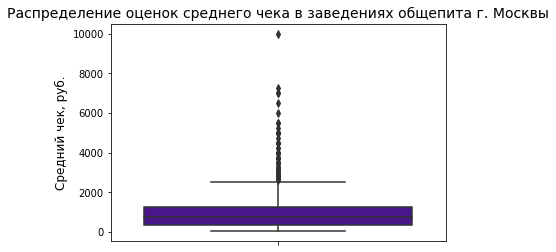

In [34]:
data['avg_bill'].replace('Средний счёт:от 0 ₽', np.nan , inplace = True)
data['middle_avg_bill'].replace( 0.0, np.nan, inplace = True) 

sns.boxplot(y='middle_avg_bill', data=data, color = '#46039f')
plt.title('Распределение оценок среднего чека в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Средний чек, руб.', fontsize=12);

Нижняя граница значений столбца все еще близка к 0. Посмотрим на конкретные значения.

In [35]:
data['middle_avg_bill'].describe()

count     3146.000000
mean       944.345518
std        787.092283
min         30.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      10000.000000
Name: middle_avg_bill, dtype: float64

Посмотрим, к каким объектам относятся средние цены менее 100 руб.

In [36]:
data[data['middle_avg_bill'] < 100]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1951,пончики! выпекаем на месте,кофейня,"Москва, улица Яблочкова, 19Г",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.819120,37.578073,4.6,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,250.0
2316,монастырская чайная,кафе,"Москва, 2-й Красносельский переулок, 5с3",Центральный административный округ,"ежедневно, 09:00–21:00",55.783773,37.666269,4.1,NaN,Средний счёт:35–100 ₽,67.0,NaN,0,NaN
5420,пончики! выпекаем на месте,булочная,"Москва, Новокосинская улица, 35",Восточный административный округ,"ежедневно, 08:00–22:00",55.743570,37.866127,4.3,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,4.0
6428,бургер mix,фастфуд,"Москва, улица Гурьянова, 2А",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.693587,37.722745,4.1,низкие,Средний счёт:90 ₽,90.0,NaN,0,40.0
6543,пончики! выпекаем на месте,кофейня,"Москва, проспект Вернадского, 109",Западный административный округ,пн-сб 08:00–22:00; вс 09:00–22:00,55.662333,37.483580,4.7,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,5.0
7297,пончики! выпекаем на месте,кофейня,"Москва, Люблинская улица, 163/1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.651354,37.744222,4.7,NaN,Средний счёт:50 ₽,50.0,NaN,1,93.0
7545,шаурмян у арена,фастфуд,"Москва, Краснодарская улица, 47",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.677744,37.764810,3.3,NaN,Средний счёт:от 30 ₽,30.0,NaN,0,2.0


Учитывая характер заведений, цены выглядят вполне вероятными: можно поверить, что посетители берут там пару пончиков или лаваш на сумму менее 100 руб. Оставляем данные без корректировки.

Стоит отметить еще  2 особенности в выборке данных, которую мы видим выше:

1) На примере строки 5420 ("пончики! выпекаем на месте" == булочная) и строки 1951("пончики! выпекаем на месте" == кофейня) мы видим, что в датафрейме заведения одной сети могут быть размечены как заведения разного типа, что некорректно, т.к. концепция сети всегда остается единой. Нужно будет выявить и скорректировать все подобные случаи.

2) Пропущенные значения в столбце price в ряде случаев можно скорректировать по столбцам middle_avg_bill, middle_coffee_cup, avg_bill.

Вернемся к этим 2 пунктам ниже.

Теперь проверим, можно ли заполнить часть пропусков в столбце middle_avg_bill на основании данных столбца avg_bill.

In [37]:
bill = 'Средний счёт'
data.query('middle_avg_bill.isnull() & avg_bill.notnull() & avg_bill.str.contains(@bill)')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Мы получили пустой датафрейм. Таким образом, во всех случаях, когда в столбце avg_bill есть данные о размере среднего чека, эта информация уже отражена в столбце middle_avg_bill . Пропуски в столбце middle_avg_bill не являются некорректными и не требуют заполнения.

#### Price: пропуски,  проверка неявных дубликатов

Посмотрим, какие ценовые категории заведений выделены в датафрейме.

In [38]:
data['price'].value_counts()

средние          2117
выше среднего     564
высокие           476
низкие            157
Name: price, dtype: int64

В датафрейме приводится 4 градации цен в заведениях общественного питания: высокие - выше среднего - средние - низкие.    
Написания уникальны, дубликатов нет.

У нас есть гипотеза, что на основании 3 столбцов, отражающих финансовые аспекты работы заведения, - avg_bill, middle_avg_bill и middle_coffee_cup - мы можем заполнить пропуски в столбце price (61% пропусков).   
Проверим, какое количество пропусков мы сможем заполнить таким образом.

In [39]:
data.query('price.isnull() & middle_coffee_cup.notnull()')['name'].count()

257

In [40]:
data.query('price.isnull() & middle_avg_bill.notnull()')['name'].count()

470

Для 470 строк столбец price может быть заполнен на основании столбца middle_avg_bill и для 257 строк - на основании столбца middle_coffee_cup.

In [41]:
data.query('price.isnull() & middle_avg_bill.isnull() &  middle_coffee_cup.isnull() &  avg_bill.notnull()')['name'].count()

16

Еще для 16 строк столбец price может быть заполнен на основании столбца avg_bill.

Попробуем выявить закономерность, каким образом заведениям присваивалась та или иная ценовая категория.  
Первым шагом - посмотрим, что является высокой, средней или низкой ценой чашки кофе.

In [42]:
data.groupby('price')['middle_coffee_cup'].describe().reset_index()

# px.bar(data, y= "middle_coffee_cup", x = "price", color="middle_coffee_cup", barmode="group")
# график не очевиден с точки зрения интерпретации, решила скрыть

,price,count,mean,std,min,25%,50%,75%,max
0,высокие,1.0,250.000000,NaN,250.0,250.0,250.0,250.00,250.0
1,выше среднего,2.0,203.000000,74.953319,150.0,176.5,203.0,229.50,256.0
2,низкие,57.0,136.614035,39.306831,60.0,110.0,139.0,154.00,256.0
3,средние,218.0,203.403670,55.366582,60.0,160.0,200.0,255.75,328.0


Как мы видим, в отнесении заведения к той или иной ценовой категории на основании цены чашки капучино нет четкой закономерности.

Для средней стоимости чашки капучино:
- высокие цены включают одно значение – 250 рублей,
- цены выше среднего варьируются от 150 до 256 рублей,
- средние цены варьируются от 60 до 328 рублей,
- низкие цены – от 60 до до 256 рублей.

Как мы видим, диапазоны пересекаются, и логика отнесения заведений в ту или иную категорию не описывается средней ценой чашки капучино.

Посмотрим, что является высокой, средней или низкой категорией среднего чека.

In [43]:
data.groupby('price')['middle_avg_bill'].describe()

,count,mean,std,min,25%,50%,75%,max
price,,,,,,,,
высокие,434.0,2383.732719,942.420540,950.0,1750.0,2000.0,2500.0,10000.0
выше среднего,481.0,1344.189189,226.774410,375.0,1250.0,1250.0,1500.0,4500.0
низкие,93.0,217.311828,114.653161,90.0,150.0,180.0,250.0,600.0
средние,1668.0,598.908273,294.840114,165.0,350.0,500.0,850.0,2150.0


Как и в случае с ценой чашки капучино, не удается выявить закономерности в отнесении заведений к той или иной категории, исходя из размера среднего чека:
- высокие цены варьируются от 950 до 10000 рублей,
- цены выше среднего – от 375 до 4500 рублей,
- средний ценовой диапазон – от 165 до 2150 рублей,
- низкие цены – от 90 до 600 рублей.

Вероятно, отнесение к той или иной ценовой категории зависит не только от цены чашки кофе или размера среднего чека как таковых, но и их привязки к категории заведения и локации.

Таким образом, мы приходим к выводу, что мы не сможем корректно заполнить столбец price на основании других столбцов с финансовой информацией, поэтому оставим его в том виде, в каком он приводится в исходном датафрейме.

#### Seats: выбросы, изменение типа данных

Как мы отметили на этапе первичного ознакомления с данными, в столбце seats:

  - Данные имеют тип float, хотя логически им больше подходит тип int: количество мест в заведении должно быть целым числом.

- Минимальное значение количества мест в заведениях - 0 мест - на первый взгляд может выглядеть сомнительно, но оно может быть характерно для заведений, работающих только на вынос. Нужно проверить, к заведениям какого типа относится это значение. 


- Максимальное значение - 1288 мест- возможно в случае, если относится к крупным ресторанам / банкетным залам. Стоит проверить тип заведения, к которому относится это значение.

Для начала заменим тип данных в столбце на целочисленный.   
Поскольку в столбце есть значения NaN, произведем замену с использованием типа Int64.

In [44]:
data['seats'] = data['seats'].astype('Int64')
data['seats'].dtypes

Int64Dtype()

Теперь посмотрим на распределение количества мест в заведениях еще раз.

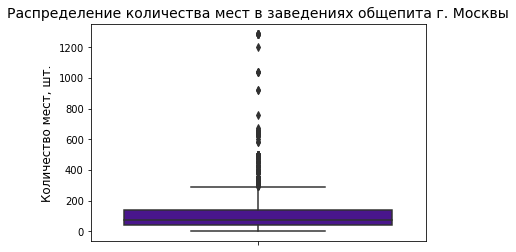

In [45]:
sns.boxplot(y='seats', data=data, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12);

Как мы видим, в массиве есть некоторое количество очень крупных выбросов.  
Рассмотрим их подробнее.

In [46]:
data.query('seats > 700')[['name', 'category', 'address', 'district', 'seats']].sort_values(by='seats', ascending = False)

,name,category,address,district,seats
6524,ян примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,1288
6574,мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,1288
6808,яндекс.лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,1288
6807,loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,1288
6771,точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,1288
6690,японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,1288
6684,пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,1288
6658,гудбар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,1288
6641,one price coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,1288
6838,alternative coffee,кофейня,"Москва, проспект Вернадского, 41, стр. 1",Западный административный округ,1288


Как мы видим:

- У первых 11 заведений совпадает количество мест, а также все они удивительным образом расположены на проспекте Вернадского.
- Еще 4 заведения имеют одинаковое количество мест - 1040 - и расположены по одному и тому же адресу - Измайловское шоссе, 71, корп. А.
- 2 заведения, которые имеют по 920 мест, расположены по одному адресу - Киевская улица, 2.

При этом многие из указанных заведений даже на первый взгляд, без дополнительной проверки, нельзя отнести к крупным ресторанам или банкетным залам. С трудом можно представить себе пиццерию на 1288 мест или кофейню One Price coffee такой же вместимости.

Выборочная проверка с использованием внешних источников информации подтверждает, что данные о количестве мест в заведениях выше некорректны:


- Строка 6524: Ян Примус, проспект Вернадского, 121, корп. 1  - Общее количество посадочных мест: 160 вместо указанных в датафрейме 1288. - https://www.gdebar.ru/bars/sokolnicheskaya/yugo-zapadnaya/yan-primus-na-yugo-zapadnoj


- Строка 6518: 	DelonixCafe, проспект Вернадского, 94, корп. 1 	- Общее количество посадочных мест: 40 вместо  указанных в датафрейме 1288.(https://www.gdebar.ru/bars/sokolnicheskaya/yugo-zapadnaya/delonix)


- Строка 4231:	рестобар Аrgomento, Кутузовский проспект, 41, стр. 1 -  Общее количество посадочных мест: 30 вместо указанных в датафрейме 1200. - https://www.gdebar.ru/bars/filevskaya/kutuzovskaya/argomento 
 
 
- Строка 2713: Ваня и Гоги, Москва, Измайловское шоссе, 71, корп. А - Вместимость основного зала до 60 чел. вместо указанных в датафрейме 1040 (http://cafevangogi.ru/zali1.htm).


- Строка 4180: Еataly, Киевская улица, 2. Общее количество посадочных мест: 482 вместо 920 (https://www.gdebar.ru/bars/arbatsko-pokrovskaya/kievskaya/eataly-na-kievskoj).


Можем заключить, что все значения из выборки выше являются ошибочными. В случае реального проекта следовало бы выяснить, каким образом возникли данные ошибки и перевыгрузить датафрейм, т.к. ошибочными могут быть и более мелкие значения.

Сейчас же заменим выбросы, отмеченные выше, на NaN, а также внесем данные о вместимости заведений, найденные в ходе выборочной проверки.

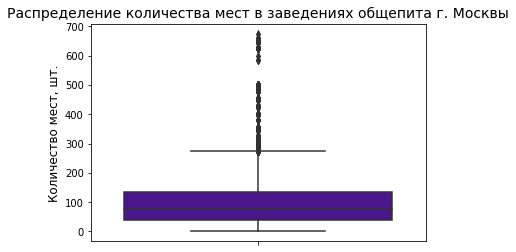

In [47]:
data['seats'].replace([1288, 1200, 1040, 920, 760] , np.nan, inplace = True) 

data.loc[6524, 'seats'] = 160
data.loc[6518, 'seats'] = 40
data.loc[4231, 'seats'] = 30
data.loc[2713, 'seats'] = 60
data.loc[4180, 'seats'] = 482

sns.boxplot(y='seats', data=data, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12);

Как мы видим, в столбце все еще сохраняется достаточно большое количество выбросов.  
Рассмотрим кластер наиболее крупных из них подробнее.

In [48]:
data.query('seats > 550')[['name', 'category', 'address', 'district', 'seats']].sort_values(by='seats', ascending = False)

,name,category,address,district,seats
7987,ресторан,ресторан,"Москва, улица Маршала Захарова, 6, корп. 1",Южный административный округ,675.0
2901,ресторан тройка,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,660.0
2913,хаус бар,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,660.0
5758,шоколадница,кофейня,"Москва, Мичуринский проспект, 22, корп. 1",Западный административный округ,650.0
5655,the fox pub,"бар,паб","Москва, Мичуринский проспект, 22, корп. 1",Западный административный округ,650.0
5738,университетское,кофейня,"Москва, Мичуринский проспект, 8, стр. 1",Западный административный округ,650.0
5720,ресторан китайской кухни чуаньюй,ресторан,"Москва, Мичуринский проспект, 7, корп. 1",Западный административный округ,650.0
5835,lyanson’s coffee,кафе,"Москва, Мичуринский проспект, 27, корп. 1",Западный административный округ,650.0
5841,for your kids,кафе,"Москва, Мичуринский проспект, 58, корп. 1",Западный административный округ,650.0
6548,vibes cafe,кафе,"Москва, улица Миклухо-Маклая, 6",Юго-Западный административный округ,644.0


Этот кластер данных также вызывает сомнения: 

- Значение 625 повторяется слишком часто, что выглядит странным;
- Количество посадочных мест не всегда корректно соотносится с типом заведения. Ресторан или банкетный зал может иметь подобную вместимость, но кафе "Пончики от бабушки" на 585 мест сложно себе представить.

Выборочная проверка с использованием внешних источников информации подтверждает, что данные о количестве мест в заведениях выше некорректны:

 - Строка 7987: ресторан с неуказанным названием, улица Маршала Захарова, 6, корп. 1. По этому адресу расположен ресторан Шахин-Шах вместимостью 280 мест (Ресторан — 220 мест, Шатры — 8 мест, VIP-зал — 40 мест, Летние беседки — 12 мест. https://tomesto.ru/moskva/places/shahin-shah)
 
- Строка 5655: the fox pub, Мичуринский проспект, 22, корп. 1. Общее количество посадочных мест: 120 (https://www.gdebar.ru/bars/solncevskaya/ramenki/the-fox-pub)


- Строка 5720: ресторан китайской кухни Чуаньюй, Мичуринский проспект, 7, корп. 1.  Общее количество посадочных мест: около 144 (общий зал вместимостью 70 человек и комнаты на 6, 8, 20 или 40 персон; количество отдельных комнат при этом не указано; https://chy.rest/about/)


- Строка 1766: ресторан Золотая Бухара, Ленинградский проспект, 48, подъезд 1. Общее количество посадочных мест: 90 (https://www.gdebar.ru/bars/zamoskvoreckaya/aeroport/zolotaya-buhara-na-leningradke)


- Строка 1355: ресторан Страдивари, Ленинградский проспект, 77, корп. 1. Вместимость:100 человек (https://birthday-place.ru/catalog/restoran-stradivari/stradivari/)


- Строка 1672: ресторан Ача-чача, Ленинградский проспект, 9Б, стр. 1. Вместимость: 104 человека (1 зал на 64 чел, веранда 40 чел; https://tomesto.ru/moskva/places/acha-chacha)


- Строка 6158: кафе Мармелад, улица Гарибальди, 1А. Общее количество посадочных мест: 116 мест (основной зал на 56 мест, второй зал на 2м этаже на 30 мест (банкетный), третий зал караоке зал на 30 мест (ПТ и СБ); https://tomesto.ru/moskva/places/marmelad)


- Строка 1351: Максима пицца, Ленинградский проспект, 78, корп. 1.  Общее количество посадочных мест: 135 мест (1-й зал — 15 мест, 2-й зал — 25 мест, 3-й зал — 25 мест, 4-й зал — 30 мест. Летняя терраса 40 мест; https://tomesto.ru/moskva/places/maksima-pitstsa)

Можем заключить, что все значения из выборки выше являются ошибочными.   
Заменим выбросы, отмеченные выше, на NaN, а также внесем данные о вместимости заведений, найденные в ходе выборочной проверки.

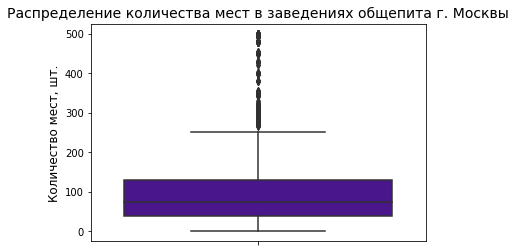

In [49]:
data['seats'].replace([675, 660, 650, 644, 625, 600, 585] , np.nan, inplace = True) 

data.loc[7987, 'seats'] = 280
data.loc[5655, 'seats'] = 120
data.loc[5720, 'seats'] = 144
data.loc[1766, 'seats'] = 90
data.loc[1355, 'seats'] = 100
data.loc[1672, 'seats'] = 104
data.loc[6158, 'seats'] = 116
data.loc[1351, 'seats'] = 135

sns.boxplot(y='seats', data=data, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12);

Количество выбросов все еще велико, но теперь они выглядят распределенными более равномерно.  
Посмотрим, как будут выглядеть данные о количестве мест на гистограмме.

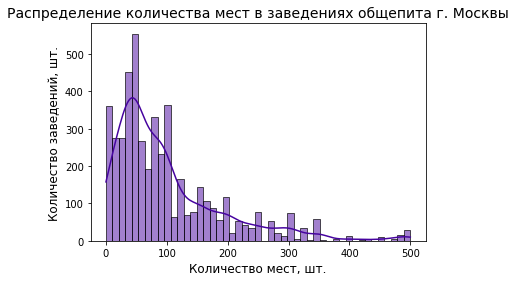

In [50]:
sns.histplot(data=data, x="seats", kde=True, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.xlabel('Количество мест, шт.', fontsize=12)
plt.ylabel('Количество заведений, шт.', fontsize=12);

На графике выше любопытно выглядят пики на значениях 300, 350, 500.  
Кажется, эти значения проставлены для большого количества заведений. 

Посмотрим верхние значения датафрейма еще раз.

In [51]:
data.query('seats > 450')[['name', 'category', 'address', 'district', 'seats']].sort_values(by='seats', ascending = False)

,name,category,address,district,seats
898,ош,кафе,"Москва, Ярославское шоссе, 114, корп. 1",Северо-Восточный административный округ,500.0
2021,gt. coffee,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
4326,florentini,ресторан,"Москва, Старая Басманная улица, 9, корп. 1",Центральный административный округ,500.0
1064,восток,кафе,"Москва, Ярославское шоссе, 19, стр. 1",Северо-Восточный административный округ,500.0
2093,марокко,ресторан,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
2092,siam,ресторан,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
2079,шеф burger & doner,фастфуд,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
2078,ламянь,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
2077,crema,кофейня,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0
2057,чайна таун,ресторан,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,500.0


Как мы видим, данные в этой подвыборке опять выглядят ненадежными: 

- Значения 500, 495, 480 мест повторяются достаточно часто. Большинство других значений также не единичны.
- Есть объекты, количество мест в которых не соответствует категории заведения, например, кофейни Crema или Кофемания на 500 мест, кафе при АЗС на 500 мест или Чебуречная СССР на 480 мест.

Выборочная проверка с использованием внешних источников информации также подтверждает, что данные о количестве мест в заведениях выше некорректны:

- Строка 4326: ресторан Florentini, Старая Басманная улица, 9, корп. 1. Общее количество посадочных мест: 145
(https://www.gdebar.ru/bars/sokolnicheskaya/krasnye-vorota/florentini-siti-kafe-na-staroj-basmannoj)


- Строка 6719: ресторан Дхаба, Ленинский проспект, 146. Общее количество посадочных мест: 116 (Летняя терраса 10 мест. Основной зал — 90 мест, 2 зала по 8 мест. https://tomesto.ru/moskva/places/dhaba-leninskiy)


- Строка 4228: ресторан Месопотамия, улица Арбат, 4, стр. 1. Общее количество посадочных мест: 215 (Основной зал на 150 мест, Караоке-зал на 40 мест. VIP 25 мест. https://tomesto.ru/moskva/places/mesopotamiya)


- Строка 3762: Guests in the City, улица Арбат, 1. По концепции заведение является рестораном, а не баром. Общее количество посадочных мест: 64 (1 зал — 50 мест,  Летняя терраса 14 мест; https://tomesto.ru/moskva/places/guests-in-the-city)


- Строка 6335: ресторан Мясо&Рыба, Автозаводская улица, 18. Общее количество посадочных мест: 400 (Общий зал на 250 п./мест, Банкетный зал на 150 п./мест; https://tomesto.ru/moskva/places/myaso-ryba-avtozavodskaya/banket). В этом случае значение оказалось уже близким к указанным в датафрейме 455 местам.


- Строка 3907: Hard Rock Cafe. Вместимость до 500 человек (https://tomesto.ru/moskva/places/hard-rock-cafe). В этом случае значение оказалось уже близким к указанным в датафрейме 480 местам.


Вместе с тем, стоит отметить, что в выборку попали 2 заведения, где указанное в датафрейме количество мест уже было близким к тому, что указано в открытых источниках - ресторан Мясо&Рыба и Hard Rock Cafe. Число мест в этих случаях не совпало полностью, но порядок был сопоставим. То есть, значения по 400-500 мест в заведении уже могут быть адекватными (реалистичными).

Заменим выбросы, отмеченные выше, на NaN, а также внесем данные о вместимости заведений, найденные в ходе выборочной проверки.

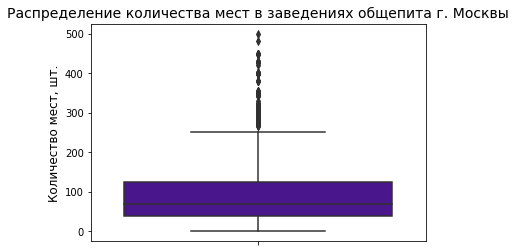

In [52]:
data['seats'].replace([500, 455, 478, 480, 481, 491, 495] , np.nan, inplace = True) 

data.loc[4326, 'seats'] = 145
data.loc[6719, 'seats'] = 116
data.loc[4228, 'seats'] = 215
data.loc[3762, 'seats'] = 64
data.loc[3762, 'category'] = 'ресторан'
data.loc[6335, 'seats'] = 400
data.loc[3907, 'seats'] = 500

sns.boxplot(y='seats', data=data, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12);

Посмотрим, как будут выглядеть данные о количестве мест на гистограмме.

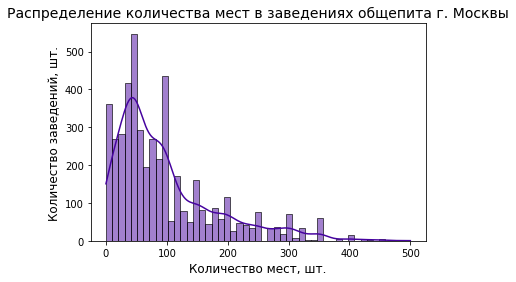

In [53]:
sns.histplot(data=data, x="seats", kde=True, color = '#46039f')
plt.title('Распределение количества мест в заведениях общепита г. Москвы', fontsize=14)
plt.xlabel('Количество мест, шт.', fontsize=12)
plt.ylabel('Количество заведений, шт.', fontsize=12);

Рассмотрим "хвост" данных.

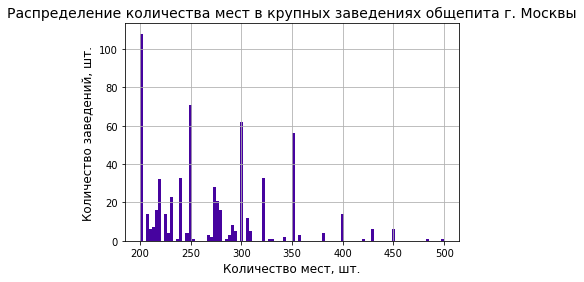

In [54]:
data.query('seats >= 200')['seats'].hist(bins=100, color= '#46039f')
plt.title('Распределение количества мест в крупных заведениях общепита г. Москвы', fontsize=14)
plt.xlabel('Количество мест, шт.', fontsize=12)
plt.ylabel('Количество заведений, шт.', fontsize=12);

Как мы видим, имеющиеся данные дискретны.   
Встречается много круглых значений, например - 200, 250, 300, 350. Между ними - большие промежутки. 
Это может быть связано как со спецификой отрасли общественного питания (вероятно, в заведениях изначально планируется некое "ровное" число мест), так и с некорректностью данных в столбце.

По тому процессу очистки данных, который мы провели выше, мы можем сказать, что все данные в столбце seats требуют серьезной проверки и - вероятно - корректировки. Использовать их в том виде, в каком они есть, нельзя.

Кроме того, в столбце seats также есть нулевые значения.  
Посмотрим, связаны ли они с категорией фастфуда (в таком случае они будут логически обоснованными).

In [55]:
data.query('seats == 0').groupby('category').agg('count')['name']

category
бар,паб      4
булочная    11
кафе        44
кофейня     24
пиццерия    10
ресторан    20
столовая     5
фастфуд     18
Name: name, dtype: int64

Можно допустить, что в барах, булочных, кофейнях и фастфуде может не быть посадочных мест. 
Странно в данном случае выглядят кафе и рестораны без столиков.

In [56]:
rest = 'ресторан'
data.query('seats == 0 & category == @rest')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
663,стейки bar-b-que,ресторан,"Москва, Солнечногорская улица, 15, корп. 1",Северный административный округ,NaN,55.860799,37.519259,4.4,NaN,NaN,NaN,NaN,0,0.0
803,нуш донер,ресторан,"Москва, Ботаническая улица, 41, корп. 7",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.846158,37.584032,4.0,NaN,NaN,NaN,NaN,0,0.0
1233,пекарняуз,ресторан,"Москва, Таллинская улица, 26",Северо-Западный административный округ,NaN,55.800123,37.407882,4.3,NaN,NaN,NaN,NaN,0,0.0
2744,намшон,ресторан,"Москва, Семёновская площадь, 7, корп. 17А",Восточный административный округ,"ежедневно, 10:00–23:00",55.784497,37.721759,4.4,NaN,Средний счёт:300–500 ₽,400.0,NaN,0,0.0
5334,сушистор,ресторан,"Москва, Зелёный проспект, 24",Восточный административный округ,"ежедневно, 10:00–23:00",55.750721,37.789551,4.1,NaN,NaN,NaN,NaN,1,0.0
5345,кинопицца,ресторан,"Москва, Мартеновская улица, 25",Восточный административный округ,"ежедневно, 10:00–22:00",55.749821,37.802494,4.4,NaN,Средний счёт:500–1000 ₽,750.0,NaN,0,0.0
5410,sugarbey,ресторан,"Москва, Красноказарменная улица, 23",Юго-Восточный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.753497,37.712918,4.4,средние,Средний счёт:300–600 ₽,450.0,NaN,0,0.0
5453,яндекс.лавка,ресторан,"Москва, 2-я Владимирская улица, 10",Восточный административный округ,"ежедневно, 07:00–00:00",55.759886,37.779134,4.0,NaN,NaN,NaN,NaN,1,0.0
5920,таманно,ресторан,"Москва, улица Орджоникидзе, 12, стр. 4",Южный административный округ,"ежедневно, 09:00–00:00",55.710198,37.591130,4.4,средние,Средний счёт:от 300 ₽,300.0,NaN,0,0.0


Как мы видим, во многих случаях ошибка возникает из-за некорректного отнесения того или иного заведения к категории ресторанов вместо фастфуда (например, Теремок), пекарни (например, Пекарняуз) или кофейни (например, Рiccolo coffee).  

Ниже скорректируем категории заведений там, где это возможно сделать с минимальными затратами времени - для сетевых заведений.

#### Chain & Category: приведение сетевых объектов к единой категории

Как мы заметили при анализе столбца middle_avg_bill, иногда заведения одной сети в исходном датафрейме отнесены к различным категориям объектов.  

В частности, на примере строки 5420 ("пончики! выпекаем на месте" == булочная) и строки 1951("пончики! выпекаем на месте" == кофейня) мы видим, что в датафрейме заведения одной сети могут быть размечены как заведения разного типа.
Это некорректно, т.к. концепция сети всегда остается единой. 

Нужно выявить и скорректировать все подобные случаи.

Для начала посмотрим, как часто встречаются подобные случаи.

In [57]:
is_chain = 1 #сетевой объект

categories_of_chains = (data.query('chain == @is_chain')
                        .pivot_table(index = 'name', values = 'district', columns = 'category', aggfunc ='count')
                        .sort_values(by = 'кафе', ascending =False))

categories_of_chains['num_of_categories'] = (categories_of_chains[['бар,паб', 'булочная', 'кафе', 'кофейня', 
                                                                   'пиццерия', 'ресторан', 'столовая', 'фастфуд']]
                                             .count(axis=1))

categories_of_chains.query('num_of_categories > 1')['num_of_categories'].count()

341

В исходном датафрейме для 341 сети общественного питания категории заведений внутри сети не совпадают.  
Это число значительно относительно количества всех имеющихся в датафрейме сетей.

In [58]:
categories_of_chains.query('num_of_categories > 1').head(10)
categories_of_chains.head(10)

category,"бар,паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд,num_of_categories
name,,,,,,,,,
кулинарная лавка братьев караваевых,NaN,NaN,39.0,NaN,NaN,NaN,NaN,NaN,1
drive café,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,1
french bakery sedelice,NaN,2.0,19.0,3.0,NaN,NaN,NaN,NaN,3
андерсон,NaN,NaN,17.0,1.0,NaN,4.0,NaN,NaN,3
брусника,NaN,NaN,12.0,1.0,1.0,NaN,NaN,NaN,3
вареничная № 1,NaN,NaN,12.0,NaN,NaN,2.0,NaN,NaN,2
му-му,1.0,NaN,12.0,2.0,1.0,8.0,1.0,2.0,7
wild bean cafe,NaN,NaN,11.0,14.0,NaN,1.0,NaN,1.0,4
хинкали-gали!,NaN,NaN,8.0,NaN,NaN,NaN,NaN,1.0,2


Как мы можем скорректировать категории в подобных случаях:

- Найдем категорию с максимальным числом заведений в ней в рамках выбранной сети.
- Присвоим эту категорию всем заведениям сети в основном датафрейме.

Найдем категорию с максимальным числом заведений в ней в рамках выбранной сети и выведем ее в отдельный столбец.

In [59]:
# В комментарии ниже - первоначальное решение через .idxmax(), которое в итоге решено не использовать,
# поскольку .idxmax() в случае нескольких значений, соответствующих максимуму, возвращает только индекс первого из них.

#categories_of_chains['max_cat'] = (categories_of_chains[['бар,паб', 'булочная', 'кафе', 'кофейня', 
#                                                         'пиццерия', 'ресторан', 'столовая', 'фастфуд']]
#                                   .idxmax(axis=1)) 
                                # dataframe.idxmax() function returns index of first occurrence 
                                # of maximum over requested axis

#categories_of_chains.columns = ['бар,паб', 'булочная', 'кафе', 'кофейня', 
#                                'пиццерия', 'ресторан', 'столовая', 'фастфуд', 'num_of_categories', 'max_cat']
#categories_of_chains.reset_index(inplace=True)

In [60]:
categories_of_chains_T = categories_of_chains.drop('num_of_categories', axis = 1).T.reset_index()
categories_of_chains_T.set_index('category', inplace = True)
categories_of_chains_T

name,кулинарная лавка братьев караваевых,drive café,french bakery sedelice,андерсон,брусника,вареничная № 1,му-му,wild bean cafe,хинкали-gали!,kuzina,...,шик шашлык,штолле,эзо,эль кафе,юг,я люблю суши,ян примус,яндекс.лавка,ё-ланч,ёрш
category,,,,,,,,,,,,,,,,,,,,,
"бар,паб",NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
булочная,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
кафе,39.0,24.0,19.0,17.0,12.0,12.0,12.0,11.0,8.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
кофейня,NaN,NaN,3.0,1.0,1.0,NaN,2.0,14.0,NaN,NaN,...,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN
пиццерия,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
ресторан,NaN,NaN,NaN,4.0,NaN,2.0,8.0,1.0,NaN,NaN,...,NaN,NaN,2.0,NaN,2.0,4.0,2.0,72.0,NaN,NaN
столовая,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN
фастфуд,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,1.0,NaN,...,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [61]:
main_cat_list = []
for col in categories_of_chains_T:
    cats = (categories_of_chains_T[categories_of_chains_T[col] == categories_of_chains_T[col].max()].index.tolist())
    #логика: df[df.col == df.col.max()].index.tolist()
    if len(cats) == 1:
        main_cat_list.append(cats[0])
    else:
        main_cat_list.append(np.nan)

# print (main_cat_list)
categories_of_chains['main_cat']= main_cat_list

#categories_of_chains.head(10)
categories_of_chains.tail(10)

category,"бар,паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд,num_of_categories,main_cat
name,,,,,,,,,,
шик шашлык,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1,фастфуд
штолле,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,1,булочная
эзо,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1,ресторан
эль кафе,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,1,кофейня
юг,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1,ресторан
я люблю суши,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,1,ресторан
ян примус,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2,ресторан
яндекс.лавка,NaN,NaN,NaN,NaN,NaN,72.0,NaN,NaN,1,ресторан
ё-ланч,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,1,столовая


Мы определили категории с максимальным числом заведений для каждой сети.

В случае нескольких значений, соответствующих максимуму, какая-то определенная категория для сети не выбиралась как ключевая. В этом случае в столбце main_cat проставлено значение NaN.

Посмотрим, для скольки сетей нам не удалось однозначно определить категорию.

In [62]:
categories_of_chains.query('num_of_categories > 1 & main_cat.isnull()')['num_of_categories'].count()

215

В исходном датафрейме для 341 сети общественного питания категории заведений внутри сети не совпадали - мы сократили это число до 215 сетей.

Теперь создадим словарь "сеть-основная категория" и присвоим выявленные ключевые категории заведениям соответствующих сетей в основном датафрейме.

In [63]:
chain_cat_dict = categories_of_chains["main_cat"].to_dict()

data['new_cat'] = data['name'].map(chain_cat_dict)
data.tail(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_cat
8396,пекинский двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,NaN
8397,траектория крафт-кафе,пиццерия,"Москва, улица Лобачевского, 52, корп. 1",Западный административный округ,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",55.672011,37.492628,4.4,средние,NaN,NaN,NaN,0,60.0,NaN
8398,на волгина,кафе,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,"ежедневно, 09:00–23:00",55.654933,37.521421,4.4,NaN,NaN,NaN,NaN,0,49.0,NaN
8399,"пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,NaN
8400,практика кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,1,55.0,кофейня
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,NaN
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,NaN
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,NaN
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,NaN
8405,kebab time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,NaN


Поскольку в новом столбце с указанием категории мы присваиваем значения только сетевым заведениям, для несетевых заведений, а также для сетевых заведений, для которых ключевую категорию не получилось определить однозначно, образуются пропуски.   
Заполним пропуски данными из исходного столбца category.

In [64]:
data['new_cat'] = data['new_cat']. fillna(data['category'])
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_cat
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,кафе
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,ресторан
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,кафе
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,кофейня
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,пиццерия


Теперь вернемся к 215 сетям, категорию для которых не получилось однозначно определить автоматизированно.
Посмотрим, можно ли что-то быстро определить визуально.

In [65]:
pd.set_option('display.max_rows', None)
categories_of_chains.query('num_of_categories > 1 & main_cat.isnull()')

category,"бар,паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд,num_of_categories,main_cat
name,,,,,,,,,,
пан запекан,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,2,NaN
korean chick,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,2,NaN
за обе щёки,NaN,NaN,2.0,NaN,NaN,NaN,NaN,2.0,2,NaN
швили,NaN,NaN,2.0,NaN,1.0,2.0,NaN,NaN,3,NaN
монастырская трапеза,NaN,NaN,2.0,NaN,NaN,NaN,2.0,NaN,2,NaN
восток,NaN,NaN,2.0,NaN,NaN,1.0,2.0,NaN,3,NaN
вкус дня,NaN,NaN,2.0,NaN,NaN,NaN,NaN,2.0,2,NaN
суши сет,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,2,NaN
соль,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,2,NaN


Произведем замену для тех кейсов, для которых удается определить ключевую категорию без дополнительного поиска информации.

In [66]:
data.loc[data['name'] == 'ёрш', 'new_cat']= 'бар,паб'
data.loc[data['name'] == 'кружка паб', 'new_cat']= 'бар,паб'

data.loc[data['name'] == 'espresso bar', 'new_cat']= 'кофейня'
data.loc[data['name'] == 'кофеin', 'new_cat']= 'кофейня'
data.loc[data['name'] == 'omg coffee', 'new_cat']= 'кофейня'
data.loc[data['name'] == 'kaya coffee shop', 'new_cat']= 'кофейня'

data.loc[data['name'] == 'zotman pizza', 'new_cat']= 'пиццерия'
data.loc[data['name'] == 'старый баку', 'new_cat']= 'ресторан'
data.loc[data['name'] == 'горячая выпечка', 'new_cat']= 'булочная'

Теперь у нас есть обновленные данные о категориях заведений, где существенная часть заведений одной сети отнесены к одной и той же категории.

#### Street: создание дополнительного столбца

Выделим в отдельный столбец информацию об улицах из столбца address.

In [67]:
def streets(dataframe):

    streets_list = []
    
    for i in dataframe['address']:
        street_i = i.split(',')[1]
        streets_list.append(street_i)
        
    return  streets_list

data['street'] = streets(data)

#data.head(5)
data.tail(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_cat,street
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,кафе,Профсоюзная улица
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,кафе,Пролетарский проспект
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,кафе,Люблинская улица
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,кафе,Люблинская улица
8405,kebab time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,кафе,Россошанский проезд


In [68]:
data['street'].count()

8406

In [69]:
data['address'].count()

8406

Новый столбец street с информацией об улицах, на которых расположены объекты, успешно добавлен в датафрейм.

####  Is_24/7: создание дополнительного столбца

Для начала посмотрим, какие значения есть в столбце hours.

In [70]:
data['hours'].value_counts().head(15)

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                729
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
ежедневно, 09:00–21:00                                  204
ежедневно, 09:00–22:00                                  184
ежедневно, 12:00–23:00                                  178
ежедневно, 08:00–23:00                                  160
ежедневно, 08:00–22:00                                  148
ежедневно, 09:00–23:00                                  140
ежедневно, 11:00–00:00                                  127
ежедневно, 10:00–21:00                                  103
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00     89
ежедневно, 10:00–00:00                                   79
Name: hours, dtype: int64

In [71]:
data['hours'].nunique()

1307

Поскольку в текущем виде данные в столбце hours сложны для интерпретации и использования для категоризации других данных датафрейма (см. выше: слишком много категорий с большой дробностью / детализацией информации), выделим в отдельный столбец информацию о круглосуточных объектах из столбца hours.  

Создадим дополнительный столбец - is_24/7, отражающий, что заведение работает ежедневно и круглосуточно (24/7):

- Если заведение работает ежедневно и круглосуточно - в новом столбце будет указано логическое значение True;
- В противоположном случае - логическое значение False.

Для простановки в новом столбце значений True нам необходимо будет отобрать из столбца hours значения:
- "ежедневно, круглосуточно" (мы видим, что это значение есть),
- "ежедневно, 00:00–24:00" (если такое значение встречается),
- "пн-вс, 00:00–24:00" (если такое значение встречается),
- "пн-вс, круглосуточно" (если такое значение встречается).

Для начала проверим, есть ли в датафрейме значения, в наличии которых мы сомневаемся.

In [72]:
time_range_1 = "ежедневно, 00:00–24:00" 
time_range_2 = "пн-вс, 00:00–24:00"
time_range_3 = "пн-вс, круглосуточно"

data.query('hours == @time_range_1 or hours == @time_range_2 or hours == @time_range_3')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_cat,street


Мы получили пустой датафрейм - значит, все ежедневно и круглосуточно работающие объекты размечены единнобразно, формулировкой "ежедневно, круглосуточно".   
Создадим новый столбец is_24/7, используя для фильтрации эту формулировку.

In [73]:
def is_24_7(dataframe):

    alltime_list = []
    
    for i in dataframe['hours']:
        if i == 'ежедневно, круглосуточно':
            alltime_list.append(True)
        else:
            alltime_list.append(False)
        
    return  alltime_list

data['is_24/7'] = is_24_7(data)
#data.head(5)
data.tail(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_cat,street,is_24/7
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,кафе,Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,кафе,Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,кафе,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,кафе,Люблинская улица,True
8405,kebab time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,кафе,Россошанский проезд,True


In [74]:
data['is_24/7'].sum()

729

Новый столбец успешно создан - в нем отражены данные о 729 ежедневно и круглосуточно работающих объектах.

#### Повторная проверка на явные дубликаты

Проведем повторную проверку на явные дубликаты по строкам.

In [75]:
data.duplicated().sum()

0

Все строки по-прежнему уникальны. Можно переходить к дальнейшей работе с датафреймом.

#### Вывод

<b>На этапе предобработки данных осуществлены следующие проверки и преобразования</b>:

1) Поскольку в описании данных указано, что для  маленьких сетей в разметке принадлежности объектов к сети могут встречаться ошибки, первым шагом <b> проведена проверка на предмет принадлежности заведений к сетям</b>:
- Все названия заведений для унификации приведены к нижнему регистру (различия в регистрах могут привести к неявныем дубликатам). После этого преобразования в исходном датафрейме встречается 747 уникальных названий сетевых заведений общепита;
- Подсчитано количество объектов с одним и тем же названием, поскольку нам необходимо понять, сколько объектов с идентичными названиями у нас на самом деле есть;
- Отфильтрованы названия, для которых число объектов больше 1, и для этих названий в столбце chain отмечена их принадлежность к сетевым объектам.
- Затем из перечня сетевых исключены объекты, которые имеют совпадающие названия общего характера, как, например, 'кафе', 'хинкальная', 'шаурма', и т.д., но сетевыми не являются. После этого преобразования в датафрейме осталось 762 уникальных названия сетевых заведений.
- После всех указанных преобразований распределение заведений на сетевые и несетевые в датафрейме в целом изменилось незначительно. В исходном датафрейме было 5201 несетевых и 3205 сетевых заведений. В датафрейме после всех преобразований стало  5301 несетевых и 3105 сетевых заведений. Хотя наименований сетей стало больше, количество сетевых заведений немного уменьшилось. Вероятно, это произошло из-за того, что мы удалили из категории сетевых все заведения без конкретного названия, которые в исходном датафрейме были размечены как сетевые. 

2) <b>Проверены на предмет единообразия категорий такие категориальные переменные, как chain, name,  category,  district, price</b>. За исключением столбца name,  дубликатов в категориальных переменных не обнаружено. Описание проверок и преобразований в столбце name см. в пункте 3 ниже. 

3) <b>Названия сетевых заведений проверены на уникальность</b>, поскольку их единообразное написание потребуется для дальнейшей группировки данных по сетям. <b>Выявленные разночтения в написаниях унифицированы</b>. 

После первичных преобразований в датафрейме содержалось 762 уникальных написания названий сетевых заведений общественного питания.
Однако в ходе визуального ознакомления с данными было выявлено, что ряд названий имеет различные написания, хотя заведения явно относятся к одной сети, например:

   - 'Яндекс Лавка' и 'Яндекс.Лавка' - различие состоит в точке в составном названии, 
   - 'Кондитерская-кулинария Брусника' и "Брусника" - различие состоит в полноте формулировки, и т.д. 
   
Для подобных случаев был составлен словарь и с его помощью проведена замена на единый вариант написания.
Итого, у нас осталось 749 уникальных названий сетевых заведений – будем считать, что это и есть количество уникальных сетей в датафрейме.

4) В столбце category <b>категория "быстрое питание" была переименована в "фастфуд" </b> - в дальнейшем короткая формулировка будет более удобна для построения графиков.

5) <b>Проверены и скорректированы выбросы в столбце  middle_coffee_cup</b>:

- Как мы определили в ходе первичного ознакомления с данными, максимальное значение в столбце middle_coffee_cup (средняя стоимость чашки капучино) - 1568 руб. - выглядит чрезмерно большим. График типа “ящик с усами” показывает, что это значение является единственным выбросом в данном столбце.
- Дальнейшая проверка показала, что это значение относится к кофейне Шоколадница (для сетевой Шоколадницы средняя цена 1568.0 руб. за чашку капучино - действительно нереалистично дорого). Для других объектов сети характерны средние значения в диапазоне 260-325 руб.
- Выявлено, что в строке 2859 есть ошибки, связанные с неверным вводом значения. В столбце avg_bill указан диапазон "Цена чашки капучино:230–2907 ₽", где цифра 7 в верхней границе диапазона является опечаткой, если исходить из общего уровня цен в кафе сети Шоколадница, а также, например, из строки 4800, где "Цена чашки капучино:230–290 ₽" - ровно тот диапазон, который получится в ошибочной строке 2859, если мы уберем последнюю семерку. В столбце middle_coffee_cup средняя цена посчитана неправильно, поскольку для ее расчета, вероятно, использовались некорректно введенные данные из столбца avg_bill. 
- Данные в соответствующих ячейках были скорректированы.  В столбце middle_coffee_cup не осталось выбросов.
- Исходя из очищенных данных, средняя стоимость чашки капучино в заведениях Москвы варьируется от 60 до 375 рублей.

6) <b>Проверены и скорректированы выбросы в столбце  middle_avg_bill</b>:

- Как мы определили в ходе первичного ознакомления с данными, в столбце middle_avg_bill (оценка среднего чека для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»):

    - Встречается нулевое значение, что выглядит как ошибка; 
    - Слишком высоким выглядит максимальное значение - 35000 руб. 
    
График типа “ящик с усами” показывает, что это значение 35000 руб.  действительно является крупным выбросом в данном столбце. Помимо него есть также 2 другие крупные выброса -  значения выше 9000 руб. 

Подробный анализ этих трех выбросов и поиск соответсвующих им объектов в открытых источниках показал, что данные о ценах и категориях в двух из трех объектов с очень высоким средним чеком (35000 руб. и 11000 руб.) были внесены некорректно. Информация в соответствующих ячейках была заменена на NaN. Строки не были полностью удалены из массива, поскольку заведения по этим адресам действительно существуют, а значит  эти данные пригодятся нам для нанесения их на карту объектов и / или для подсчета объектов по округам / адресам. 

Что касается третьего объекта с крайне высоким средним чеком (10000 руб.), им оказался  ресторан Гости - концептуальное место, где проходят мероприятия в формате шеф-тейбл. Вероятно, средний чек здесь действительно может быть достаточно высоким. Данные в соответствующей строке не корректировались. Средний чек для этой строки оставлен без изменений. 

В оставшемся массиве также достаточно много выбросов, но как минимум мы избавились от наиболее выбивающихся некорректных значений. В связи с тем, что ряд менее крупных выбросов сохраняется, далее при анализе среднего чека нужно будет использовать медиану, а не среднее арифметическое.

Кроме того, в столбце middle_avg_bill было обнаружено ошибочное значение среднего чека, равное 0. Ошибка произошла при вводе данных в столбце avg_bill, и далее это ошибочное значение перекочевало в столбец со средним чеком. Ошибочные значения в упомянутых ячейках были скорректированы на NaN.

После этого преобразования нижняя граница значений столбца сместилась на 30 руб., что выглядело также не очень правдоподобно. Однако анализ того, к каким объектам относятся средние цены менее 100 руб., показал, что в эту категорию попали пончиковые, шаурма и монастырская чайная.  Учитывая характер заведений, цены выглядят вполне вероятными: можно поверить, что посетители берут пару пончиков или лаваш на сумму менее 100 руб. Поэтому нижняя граница данных в столбце оставлена без корректировки.

7) <b>Проведена проверка, можно ли заполнить часть пропусков в столбцах middle_coffee_cup и middle_avg_bill на основании данных столбца avg_bill </b>.

Было проверено, есть ли такие строки, где:
- значение middle_coffee_cup пропущено, а значение avg_bill присутствует и при этом содержит строку “Цена чашки капучино”;
- значение middle_avg_bill пропущено, а значение avg_bill присутствует и при этом содержит строку “Средний счёт”.

В обоих случаях мы получили пустой датафрейм. Таким образом, <b>во всех случаях, когда в столбце avg_bill есть данные о цене чашки капучино или среднем счете, эта информация уже отражена в столбце middle_coffee_cup или middle_avg_bill соответственно. Пропуски в столбцах middle_coffee_cup и middle_avg_bill не являются некорректными и не требуют заполнения </b>.

8) <b>Проверена и отвергнута гипотеза, что на основании 3 столбцов, отражающих финансовые аспекты работы заведения, - avg_bill, middle_avg_bill и middle_coffee_cup - мы можем заполнить пропуски в столбце price</b>. Не удалось выявить закономерность, каким образом заведениям присваивалась та или иная ценовая категория.

Для средней стоимости чашки капучино:

- высокие цены включают одно значение – 250 рублей,
- цены выше среднего варьируются от 150 до 256 рублей,
- средние цены варьируются от 60 до 328 рублей,
- низкие цены – от 60 до до 256 рублей.

Как мы видим, диапазоны пересекаются, и логика отнесения заведений в ту или иную категорию не описывается средней ценой чашки капучино.

Аналогична ситуация для среднего чека:

- высокие цены варьируются от 950 до 10000 рублей,
- цены выше среднего – от 375 до 4500 рублей,
- средний ценовой диапазон – от 165 до 2150 рублей,
- низкие цены – от 90 до 600 рублей.

Как и в случае с ценой чашки капучино, не удается выявить закономерности в отнесении заведений к той или иной категории, исходя из размера среднего чека.

Вероятно, <b>отнесение заведения к той или иной ценовой категории зависит не только от цены чашки кофе или размера среднего чека как таковых, но и их привязки к категории заведения и локации </b>.
Таким образом, мы не сможем корректно заполнить столбец price на основании других столбцов с финансовой информацией. Поэтому оставим его в том виде, в каком он приводится в исходном датафрейме.


9) <b>В столбце seats скорректирован тип данных</b>. В исходном датафрейме данные имеют тип float, хотя логически им больше подходит тип int: количество мест в заведении должно быть целым числом.  Поэтому <b>произведена замена типа с float на  целочисленный</b>. Поскольку в столбце есть значения NaN,  замена произведена с использованием типа Int64.

10) <b>Проверены и скорректированы выбросы в столбце seats</b>:

В ходе предварительного ознакомления с данными было выявлено, что:

   - Минимальное значение количества мест в заведениях - 0 мест - на первый взгляд может выглядеть сомнительно, но оно может быть характерно для заведений, работающих только на вынос. 
   - Максимальное значение - 1288 мест- возможно в случае, если относится к крупным ресторанам / банкетным залам. 

Ознакомившись с данными о столбце подробнее с помощью диаграммы типа “ящик с усами”, мы выяснили, что в массиве есть значительное количество очень крупных выбросов:

   - У первых 11 заведений совпадает количество мест - 1288, а также все они удивительным образом расположены на проспекте Вернадского. 
   - Еще 4 заведения имеют одинаковое количество мест - 1040 - и расположены по одному и тому же адресу - Измайловское шоссе, 71, корп. А. 
   - 2 заведения, которые имеют по 920 мест, расположены по одному адресу - Киевская улица, 2. 
   
При этом многие из указанных заведений даже на первый взгляд, без дополнительной проверки, нельзя отнести к крупным ресторанам или банкетным залам. С трудом можно представить себе пиццерию на 1288 мест или кофейню One Price coffee такой же вместимости.

Выборочная проверка с использованием внешних источников информации подтвердила, что данные о количестве мест в заведениях выше некорректны (см. Подробнее раздел 3.8  Seats: выбросы, изменение типа данных).

В случае реального проекта следовало бы выяснить, каким образом возникли данные ошибки и перевыгрузить датафрейм, т.к. ошибочными могут быть и более мелкие значения.

В ходе учебного проекта была сделана замена выбросов, отмеченных выше, на NaN, а также для ряда заведений внесены данные о вместимости, найденные в ходе выборочной проверки.

Однако даже после этого преобразования в столбце сохранилось достаточно большое количество выбросов:

  - Значение 625 повторяется слишком часто, что выглядит странным; 
  - Количество посадочных мест не всегда корректно соотносится с типом заведения. Ресторан или банкетный зал может иметь вместимость более 500 человек, но кафе "Пончики от бабушки" на 585 мест сложно себе представить. 
  
Повторная выборочная проверка с использованием внешних источников информации подтвердила, что данные о количестве мест в заведениях второй выборки некорректны. Была сделана замена выбросов из второй выборки на NaN, а также для ряда заведений внесены данные о вместимости, найденные в ходе выборочной проверки.

После этого была сделана 3 выборка верхних значений столбца. Данные в этой выборке также выглядели ненадежными: 

  - Значения 500, 495, 480 мест повторяются достаточно часто. Большинство других значений также не единичны. 
  - Есть объекты, количество мест в которых не соответствует категории заведения, например, кофейни Crema или Кофемания на 500 мест, кафе при АЗС на 500 мест или Чебуречная СССР на 480 мест. 
  
Выборочная проверка с использованием внешних источников информации также подтверждает, что данные о количестве мест в заведениях выше некорректны. Была сделана замена выбросов из третей выборки на NaN, а также для ряда заведений внесены данные о вместимости, найденные в ходе выборочной проверки.

После этого с помощью гистограммы рассмотрен "хвост" данных. Выявлено, что имеющиеся данные дискретны. Встречается много круглых значений, например - 200, 250, 300, 350. Между ними - большие промежутки. Это может быть связано как со спецификой отрасли общественного питания (вероятно, в заведениях изначально планируется некое "ровное" число мест), так и с некорректностью данных в столбце в целом.

<b>На основании того процесса проверки максимальных значений и очистки данных, который мы провели, мы можем сказать, что все данные в столбце seats требуют серьезной проверки и - вероятно – корректировки или перевыгрузки. Использовать их в том виде, в каком они есть, нельзя</b>.

Кроме того, в столбце seats исходного датафрейма также есть нулевые значения. Мы проверили, связаны ли они с категорией фастфуда (в таком случае они могли бы быть логически обоснованными). В полученном результате среди заведений с нулевым количеством посадочных мест оказались все типы заведений: 4 бара, 11 булочных, 44 кафе и 24 кофейни, 10 пиццерий, 20 ресторанов, 5 столовых и 18 заведений фастфуда.

Можно допустить, что в барах, булочных, кофейнях и фастфуде может не быть посадочных мест. Странно в данном случае выглядят кафе и рестораны, а также столовые без столиков.
Анализ конкретных заведений показал, что во многих случаях ошибка возникает из-за некорректного отнесения того или иного заведения к категории ресторанов вместо фастфуда (например, Теремок), пекарни (например, Пекарняуз) или кофейни (например, Рiccolo coffee). Следующим шагом была сделана проверка и корректировка категории заведений там, где это возможно сделать с минимальными затратами времени - для сетевых заведений.
 
11) <b>Сетевые объекты приведены к единой категории в рамках каждой сети</b>.

Иногда заведения одной сети в исходном датафрейме отнесены к различным категориям объектов. Например, строки 5420 ("пончики! выпекаем на месте" == булочная) и 1951("пончики! выпекаем на месте" == кофейня) показывают, что заведения одной сети могут быть размечены как заведения разного типа. 
Это некорректно, т.к. концепция сети всегда остается единой. 

Мы выявили все подобные случаи расхождений категорий в рамках одной сети и скорректировали их там, где это было возможно:
- Выявлено, что в исходном датафрейме для 341 сети общественного питания категории заведений внутри сети не совпадают.
- Для всех сетей произведен подсчет, сколько из заведений этой сети относятся к той или иной категории.
- Если одно из значений отвечало понятию максимума (то есть, была только одна категория с максимальным числом заведений в ней), эта категория присваивалась всем заведениям этой сети (для этого был создан новый столбец new_cat). Таким образом, удалось сократить число сетей, категории заведений внутри которых не совпадали, с 341 до 215.
- В случае нескольких значений, соответствующих максимуму, какая-то определенная категория для сети не выбиралась как ключевая. Для таких сетей, а также для несетевых заведений, в столбце new_cat сохранены категории из исходного столбца category.

12) <b>Созданы новые столбцы street и is_24/7, содержащие информацию об улицах из столбца address и данные о 729 ежедневно и круглосуточно работающих объектах </b> соответственно.

13) После всех преобразований <b>проведена повторная проверка на явные дубликаты</b>. Определено, что <b>все строки по-прежнему уникальны </b>.

Можно переходить к дальнейшей работе с датафреймом.

### Анализ данных

#### Распределение объектов общепита по категориям

Как мы выяснили на этапе предобработки данных, в исходном датафрейме были представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная.    
Для удобства мы переименовали категорию "быстрое питание" в "фастфуд" - в дальнейшем короткая формулировка будет более удобна для построения графиков.

Посмотрим, каковы количество и доля объектов в каждой из категорий.

In [76]:
# Закоменченная часть кода ниже - вывод с исходным столбцом category.
# Вторая, активная, часть кода - вывод со столбцом new_cat, содержащим обновленные в ходе предобработки категории.
# Интересно было сравнить, насколько преобразования изменили данные в столбце: изменились только десятые доли 
# процентов.


#objects_total = data['category'].count()

#objects_num_by_type = data['category'].value_counts().reset_index()
#objects_num_by_type.columns = ['category', 'num_of_objects']
#objects_num_by_type['share']= round(objects_num_by_type['num_of_objects']/ objects_total *100, 2)


objects_total = data['new_cat'].count()

objects_num_by_type = data['new_cat'].value_counts().reset_index()
objects_num_by_type.columns = ['category', 'num_of_objects']
objects_num_by_type['share']= round(objects_num_by_type['num_of_objects']/ objects_total *100, 2)

objects_num_by_type

,category,num_of_objects,share
0,кафе,2407,28.63
1,ресторан,2019,24.02
2,кофейня,1415,16.83
3,"бар,паб",758,9.02
4,пиццерия,632,7.52
5,фастфуд,595,7.08
6,столовая,310,3.69
7,булочная,270,3.21


Визуализируем расчеты.

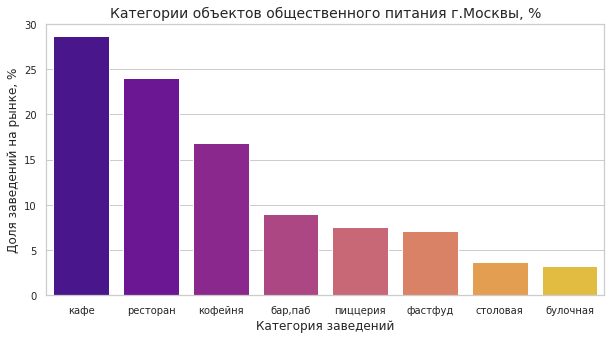

In [77]:
plt.figure(figsize=(10,5))

sns.set(style="whitegrid")

sns.barplot(x = 'category', y = 'share', data = objects_num_by_type, palette= 'plasma')
plt.title('Категории объектов общественного питания г.Москвы, %', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Доля заведений на рынке, %', fontsize=12);

- Наиболее распространенной категорией объектов общественного питания на рынке г.Москвы являются кафе. Их доля составляет 28.6%.  
- Далее следуют рестораны - их доля рынка равна 24.0%. 
- В топ-3 категорий заведений общественного питания также входят кофейни. Их доля составляет 16.8%.
- Доля пабов и баров от общего числа заведений общепита г.Москвы составляет 9.0%; доля пиццерий - 7.5%, а фастфуда - 7.1%.
- Наименее распространены столовые (3.7% рынка) и булочные (3.2% рынка).

#### Количество посадочных мест в заведениях по категориям

Как мы определили на этапе предобработки данных, данные в столбце seats требуют серьезной проверки и - вероятно - перевыгрузки.   
В них встречается достаточно много объектов с очень высоким количеством посадочных мест, которое зачастую логически не соответствует категории заведения (сложно, например, представить пиццерию или булочную вместимостью в 200-300 мест).   
Кроме того, как показала выборочная проверка по открытым источникам информации, во многих случаях данные - вне зависимости от категории заведений - действительно оказываются ошибочными.

Использовать данные о количестве мест в заведениях в том виде, в каком они есть, нельзя.  
Убедимся в этом, рассмотрев распределение количества посадочных мест по категориям заведений.

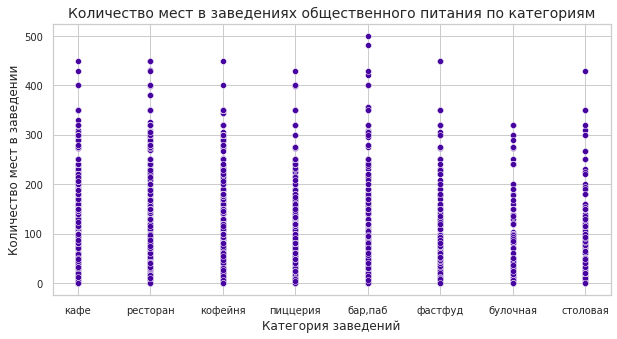

In [78]:
plt.figure(figsize=(10,5))

sns.scatterplot(data=data, x="new_cat", y="seats", color = '#46039f')
#sns.stripplot(data=data, x="new_cat", y="seats", color = '#46039f') 
# альтернативная визуализация

plt.title('Количество мест в заведениях общественного питания по категориям', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Количество мест в заведении', fontsize=12);

Как мы видим, в массиве встречаются булочные, пиццерии и заведения фастфуда вместимостью более 150-200 мест, что противоречит логике. 

Оценим не только разброс, но плотность распределения количества мест.

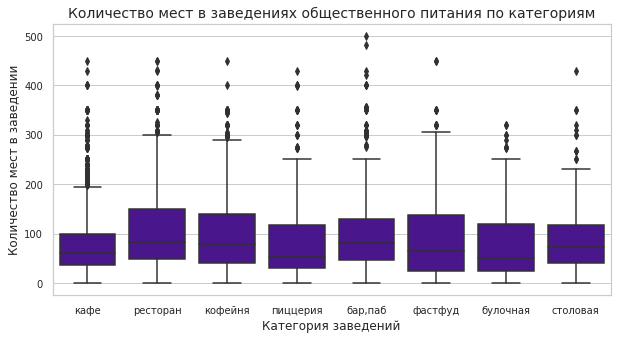

In [79]:
plt.figure(figsize=(10,5))

sns.boxplot(x=data["new_cat"], y=data['seats'], color = '#46039f')

plt.title('Количество мест в заведениях общественного питания по категориям', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Количество мест в заведении', fontsize=12);



В условиях реального проекта необходимо было бы выяснить, почему в столбце так много ошибочных данных (с учетом всех найденных в ходе предобработки ошибок), и перевыгрузить данный столбец.
В рамках данного проекта мы не будем использовать данные из этого столбца для анализа рынка и формирования выводов.

#### Соотношение сетевых и несетевых заведений в датасете

Рассмотрим соотношение сетевых и несетевых заведений в датасете. 

In [80]:
total_chains_notchains = data['chain'].count()

objects_num_by_chain = round((data['chain'].value_counts() / total_chains_notchains).reset_index(),2)
objects_num_by_chain.columns = ['is_chain', 'share']
objects_num_by_chain

,is_chain,share
0,0,0.63
1,1,0.37


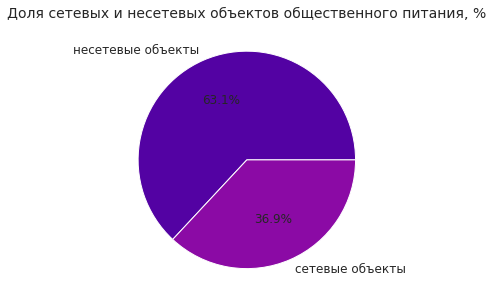

In [81]:
plt.figure(figsize=(10,5))

#define Seaborn color palette to use
colors = sns.color_palette('plasma')

nums = data['chain'].value_counts().reset_index()

numbers = list(nums['chain'])
labels = list(['несетевые объекты', 'сетевые объекты'])

#create pie chart
plt.pie(numbers, labels = labels, colors = colors, autopct='%.1f%%', textprops={'fontsize': 12})
plt.title('Доля сетевых и несетевых объектов общественного питания, %', fontsize=14);

На рынке Москвы преобладают несетевые заведения общественного питания. Их доля составляет 63.1%.  
Доля сетевых объектов составляет 36.9%.

#### Какие категории заведений чаще являются сетевыми

Посмотрим, какие категории заведений чаще являются сетевыми.

In [82]:
share_of_chains_by_cat = data.pivot_table(index='new_cat',values='chain',aggfunc=np.mean).sort_values(by='chain', ascending = False).reset_index()
share_of_chains_by_cat.columns = ['category', 'share_of_chains']
share_of_chains_by_cat

,category,share_of_chains
0,булочная,0.618519
1,пиццерия,0.542722
2,кофейня,0.517314
3,фастфуд,0.356303
4,ресторан,0.338286
5,кафе,0.302036
6,столовая,0.270968
7,"бар,паб",0.207124


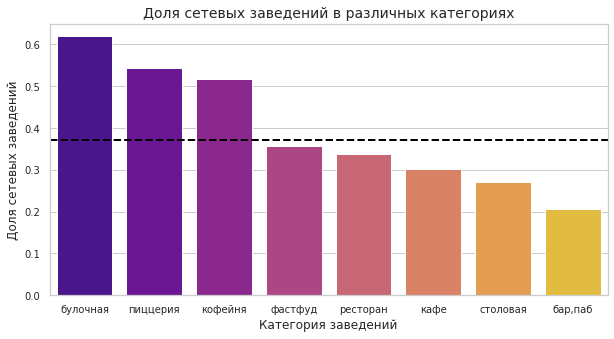

In [83]:
plt.figure(figsize=(10,5))

graph = sns.barplot(x="new_cat", y="chain", data=data, palette= 'plasma', ci= None, 
            order=["булочная", "пиццерия", "кофейня", "фастфуд", "ресторан", "кафе", "столовая", "бар,паб"]);
                                                                        
#sns.barplot(x="category", y="chain", data=data, palette= 'plasma')
#проверка, насколько отличаются данные после очистки категорий по сетям

plt.title('Доля сетевых заведений в различных категориях', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

# Добавим линию среднего (доля сетевых заведений по всей выборке)
graph.axhline(objects_num_by_chain['share'][1], color = 'black', linewidth = 2, linestyle = '--')

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Доля сетевых заведений', fontsize=12);

- Удивительно, но доля сетевых заведений наиболее высока в категории булочных. Она составляет 61.9%.
- Далее следуют пиццерии и кофейни. В этих категориях доля сетевых заведений составляет 54.3% и 51.7% соответственно.
- Доля сетевых заведений в категории фастфуда - 35.6%. В категории ресторанов - 33.8%, в категории кафе - 30.2%.
Чуть меньше сетевых заведений в категории столовых - 27.1%.
- Наименьшая доля сетевых заведений - 20.7% - характерна для категории баров и пабов.

#### Топ-15 популярных сетей в Москве

Рассмотрим, какие сети являются наиболее популярными в Москве.  
Сгруппируем данные по названиям заведений и выделим топ-15 сетей.

In [84]:
top_chains = data[data['chain'] == 1]['name'].value_counts().sort_values(ascending = False).head(15).reset_index()
top_chains.columns = ['name', 'num_of_objects']
top_chains['name'] = top_chains['name'].str.title()
top_chains

,name,num_of_objects
0,Шоколадница,120
1,Домино'С Пицца,77
2,Додо Пицца,74
3,One Price Coffee,72
4,Яндекс.Лавка,72
5,Cofix,65
6,Prime,50
7,Кофепорт,42
8,Кулинарная Лавка Братьев Караваевых,39
9,Теремок,38


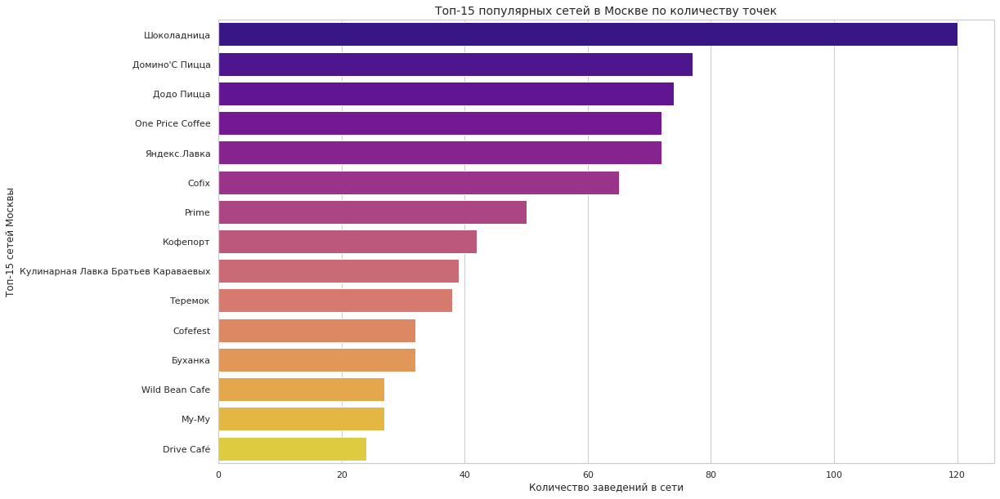

In [85]:
plt.figure(figsize=(17,10))

sns.barplot(x="num_of_objects", y="name", data=top_chains, palette= 'plasma', ci= None)

plt.title('Топ-15 популярных сетей в Москве по количеству точек', fontsize=14)

plt.xticks(rotation=0, fontsize=11)
plt.yticks(fontsize=11)

plt.xlabel('Количество заведений в сети', fontsize=12)
plt.ylabel('Топ-15 сетей Москвы', fontsize=12);

В топ-15 сетей Москвы вошли достаточно известные / массовые заведения, в частности:
  - кафе Му-Му, Prime, Cofefest, Кулинарная лавка братьев Караваевых;
  - пиццерии Домино'с Пицца и Додо Пицца;
  - кофейни Шоколадница, One Price Coffee и Cofix, Кофепорт, Wild Been Cafe, Drive Cafe;
  - фастфуд Теремок;
  - пекарня Буханка;
  - сервис доставки готовой еды Яндекс.Лавка.
  
Как мы видим, они относятся к различным категориям заведений общепита. Однако преобладают в этом списке кофейни.

Посмотрим на общее количество заведений из топ-15 сетей по категориям, определенным в датафрейме.

In [86]:
# Создадим отдельный датафрейм по топ-15 сетям.
top_chains_names = top_chains['name'].str.lower().to_list() # возвращаем названия к строчным буквам
top_15_df = data.loc[data['name'].isin(top_chains_names)]

# top_15_df_grouped = top_15_df.groupby(['district', 'category']).agg('count').reset_index()
# top_15_df_grouped = top_15_df_grouped[['district', 'category', 'name']]
# Вывод по исходному столбцу Category

top_15_df_grouped = top_15_df.groupby(['district', 'new_cat']).agg('count').reset_index()
top_15_df_grouped = top_15_df_grouped[['district', 'new_cat', 'name']].sort_values(by='name', ascending = False)
# Вывод по обновленному столбцу с категориями - new_cat

top_15_df_grouped.columns = ['district', 'category', 'num_of_objects']

top_chains_by_cats = top_15_df_grouped.pivot_table(index = 'category', values= 'num_of_objects', aggfunc= 'sum').reset_index()
top_chains_by_cats.sort_values(by='num_of_objects', ascending = False)

,category,num_of_objects
2,кофейня,358
4,ресторан,160
3,пиццерия,151
1,кафе,90
0,булочная,32


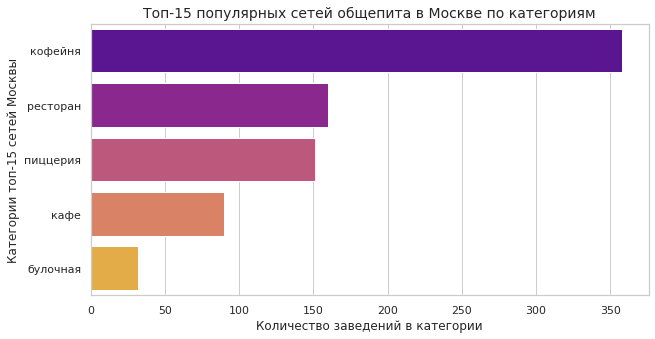

In [87]:
# Построим график, описывающий категории заведений в топ-15 сетей.
plt.figure(figsize=(10,5))

sns.barplot(x="num_of_objects", y="category", data=top_chains_by_cats, palette= 'plasma', ci= None, 
            order = ['кофейня', 'ресторан', 'пиццерия', 'кафе', 'булочная'])

plt.title('Топ-15 популярных сетей общепита в Москве по категориям', fontsize=14)

plt.xticks(rotation=0, fontsize=11)
plt.yticks(fontsize=11)

plt.xlabel('Количество заведений в категории', fontsize=12)
plt.ylabel('Категории топ-15 сетей Москвы', fontsize=12);

- Среди топ-15 популярных сетей общественного питания Москвы по количеству заведений лидируют кофейни (358 объектов).
- Далее следуют рестораны (160 объектов) и пиццерии (151 объект).
- На кафе приходится 90 объектов, и на булочные - 32 объекта.

Интересно отметить, что при построении графика по категориям в нем нет категории "фастфуд", куда логически можно было бы отнести Теремок. Также интересно, куда отнесен сервис доставки готовой еды Яндекс.Лавка, который логически не подходит ни под одну из категорий, имевшихся в исходном датафрейме. 

Кроме того, при построении графика по категориям в нем появляется категория "рестораны", в которую логически не попадает ничего из списка топ-15 заведений.

Для начала посмотрим, в какую категорию попадает Теремок.

In [88]:
terem = 'теремок'
data.query('name == @terem')['category'].value_counts()

ресторан    36
фастфуд      2
Name: category, dtype: int64

В исходном датафрейме практически во всех случаях Теремок размечен как ресторан.   
Именно поэтому нам не удалось при формировании столбца new_cat присвоить ему ту категорию, которая кажется наиболее подходящей для этой сети.

Посмотрим, в какую категорию попадает Яндекс.Лавка.

In [89]:
lavka = 'яндекс.лавка'
data.query('name == @lavka')['category'].value_counts()

ресторан    72
Name: category, dtype: int64

В исходном датафрейме во всех случаях Яндекс.Лавка размечена как ресторан.
Куда ее на самом деле стоит отнести в рамках исходной категоризации - вопрос спорный. Кажется, ей не подходит ни одна из существующих категорий.

На данном этапе мы не будем исправлять принадлежность Теремка и Яндекс.Лавки к категории ресторанов (в рамках учебного проекта сочтем их погрешностью).  
Однако в случае реального проекта необходимо было бы получить более полную документацию относительно того, как формировался исходный датафрейм, и по какому принципу заведениям в нем присваивались те или иные категории. Вероятно, при подробном ознакомлении с документацией нам пришлось бы полностью переопределить принципы отнесения заведений к тем или иным категориям для их соответствия логике и задачам нашего проекта.

Проанализируем общее количество заведений и количество заведений каждой категории по районам на основании топ-15 сетей.

In [90]:
top_chains_by_districts = top_15_df_grouped.pivot_table(index = 'district', values= 'num_of_objects', aggfunc= 'sum').reset_index()
top_chains_by_districts = top_chains_by_districts.sort_values(by='num_of_objects', ascending = False)
top_chains_by_districts

,district,num_of_objects
5,Центральный административный округ,200
1,Западный административный округ,92
2,Северный административный округ,88
8,Южный административный округ,88
3,Северо-Восточный административный округ,84
0,Восточный административный округ,75
7,Юго-Западный административный округ,72
6,Юго-Восточный административный округ,47
4,Северо-Западный административный округ,45


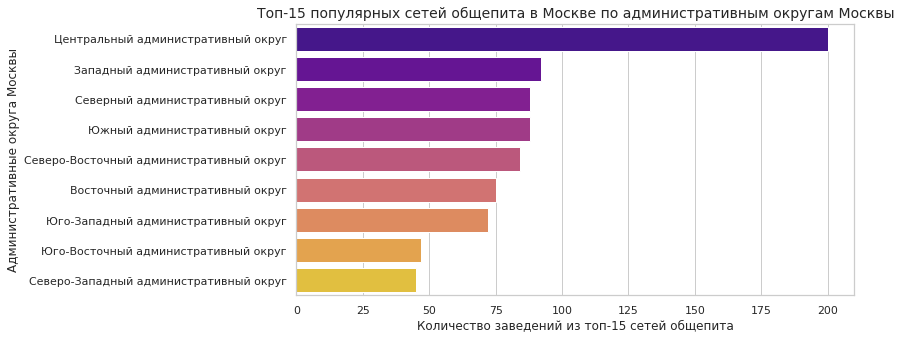

In [91]:
plt.figure(figsize=(10,5))

sns.barplot(x="num_of_objects", y="district", data=top_chains_by_districts, palette= 'plasma', ci= None)

plt.title('Топ-15 популярных сетей общепита в Москве по административным округам Москвы', fontsize=14)

plt.xticks(rotation=0, fontsize=11)
plt.yticks(fontsize=11)

plt.xlabel('Количество заведений из топ-15 сетей общепита', fontsize=12)
plt.ylabel('Административные округа Москвы', fontsize=12);

- Наибольшее количество заведений из топ-15 сетей (210 объектов) сосредоточено в Центральном административном округе. Оно более чем в два раза превышает количество заведений из топ-15 сетей в любом из других округов Москвы.
- Далее следует кластер округов с близким количеством заведений из топ-15 сетей: Северный (90 объектов), Северо-Восточный (87 объектов), Южный (85 объектов), Западный (84 объекта).
- Следующий кластер представлен Восточным и Юго-Западным административными округами - в них расположено 75 и	69 заведений из топ-15 сетей соответственно.
- Наименее представлены заведения из топ-15 сетей в Северо-Западном и Юго-Восточном административных округах (46 и 45 объектов соответственно).

Теперь посмотрим, как заведения из топ-15 сетей распределены по районам и категориям.

In [92]:
fig = px.bar(top_15_df_grouped,y='district', x='num_of_objects', color = 'category',
            height=450,
            title="Распределение заведений из топ-15 сетей по административным округам",
            labels={"category": "Категория заведения"},
            color_discrete_map=({"кофейня": "MediumPurple", "бар,паб": "#0d0887",
                      "булочная":"#7201a8", "кафе": "#bd3786", "пиццерия" : "#ed7953",
                    "ресторан": "#fdca26", "фастфуд":"#de7065", "столовая": "#b8627d"}), 
            template="simple_white")

fig.update_layout(xaxis_title="Количество заведений из топ-15 сетей", yaxis_title="Административный округ",
                  yaxis={'categoryorder':'sum ascending'})
fig.show()

- Кофейни являются ключевым типом заведений из топ-15 сетей во всех административных округах: количество кофеен больше, чем количество объектов других категорий, во всех округах.
- Наибольшее количество кофеен, а также наибольшее количество кафе и ресторанов из топ-15 сетей сосредоточено в ЦАО. 
- В ЦАО минимальное количество сетевых пиццерий и крайне мало сетевых булочных по сравнению с другими административными округами Москвы. 
- В ЮВАО сетевых кафе и булочных из топ-15 сетей нет вообще.

#### Распределение заведений общепита по районам

Как мы выяснили ранее, в датафрейме есть данные о 9 административных округах старой Москвы. Зеленоградский, Троицкий и Новомосковский округа не включены в датафрейм.

Повторим вывод информации о количестве заведений общественного питания в каждом из округов.

In [94]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

- Наибольшее количество заведений общепита (2242 объектов) приходится на Центральный административный округ Москвы. Это более чем в 2 раза больше, чем количество объектов в любом другом административном округе.
- Далее следует кластер из Северного, Южного и Северо-Восточного административных округов. Количество объектов общественного питания в них составляет 900, 892 и 891 объект соответственно.
- Следующий кластер - это Западный и Восточный административные округа с 851 и 798 объектами соответственно.
- Далее следуют Юго-Восточный и Юго-Западный округа, где расположено 714 и 709 объектов соответственно.
- Наименьшее количество объектов общественного питания (409) приходится на Северо-Западный административный округ Москвы.


Визуализируем общее количество заведений и количество заведений каждой категории по административным округам.

In [95]:
data_grouped_by_district_cat = data.groupby(['district', 'new_cat']).agg('count').reset_index()
data_grouped_by_district_cat = data_grouped_by_district_cat[['district', 'new_cat', 'name']].sort_values(by='name', ascending = False)
# Вывод по обновленному столбцу с категориями - new_cat
data_grouped_by_district_cat.columns = ['district', 'category', 'num_of_objects']

fig = px.bar(data_grouped_by_district_cat,y='district', x='num_of_objects', color = 'category',
            height=450,
            title="Распределение заведений общепита по административным округам",
            labels={"category": "Категория заведения"},
            color_discrete_map=({"кофейня": "MediumPurple", "бар,паб": "#fdca26",
                      "булочная":"#7201a8", "кафе": "#bd3786", "пиццерия" : "#ed7953",
                    "ресторан": '#46039f' , "фастфуд":'darkviolet', "столовая": "#b8627d"}), 
            template="simple_white")

fig.update_layout(xaxis_title="Количество заведений общепита", yaxis_title="Административный округ",
                  yaxis={'categoryorder':'sum ascending'})
fig.show()

- Наибольшее количество заведений общественного питания - как в целом, так и по каждой из категорий в отдельности - приходится на Центральный административный округ.
- В Центральном административном округе наиболее распространенной категорией являются рестораны. Далее следуют кафе, кофейни и бары/пабы.
- Во всех остальных административных округах наиболее распространенной категорией являются кафе. Далее следуют рестораны и кофейни.

#### Распределение средних рейтингов по категориям заведений

Посмотрим на средние рейтинги заведений общепита.

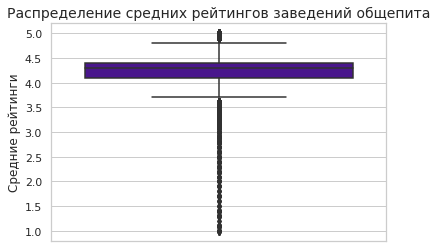

In [96]:
sns.boxplot(y='rating', data=data, color = '#46039f')
plt.title('Распределение средних рейтингов заведений общепита', fontsize=14)
plt.ylabel('Средние рейтинги', fontsize=12);

- В целом по датафрейму средние рейтинги заведений общепита варьируются от 1 до 5.
- При этом значения до 3.7 и от 4.8 являются выбросами, или крайне нетипичными, редко встречающимися оценками.
- Среднее от средних рейтингов (верхняя граница 2 квартиля) составляет 4.3.

Визуализируем распределение средних рейтингов по категориям заведений.

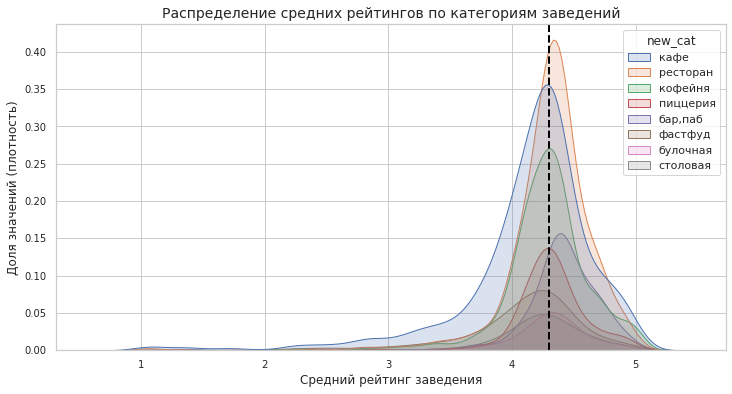

In [97]:
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")

sns.kdeplot(data=data, x='rating', hue = 'new_cat', fill=True, alpha=0.2)

plt.title('Распределение средних рейтингов по категориям заведений', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Средний рейтинг заведения', fontsize=12)
plt.ylabel('Доля значений (плотность)', fontsize=12)

# Добавим на график медианное значение среднего рейтинга по всему датасету.
xmedian = np.median(data['rating'])
plt.axvline(xmedian, c='black', linewidth = 2, linestyle = '--');

# График не окарашен в палитру plasma, т.к. это делает его менее информативным.

- Средние оценки заведений практически всех категорий являются смещенными в правую часть шкалы. Это значит, что в целом клиенты склонны оценивать заведения общественного питания скорее положительно.
- Рестораны и кофейни оцениваются клиентами более однозначно, чем заведения других категорий: график распределения более узкий, чем в остальных случаях, а значит - значения более гомогенны.
- Разброс в оценках кафе более значителен, чем в других категориях - график распределения в этом случае более широкий. Кафе чаще, чем заведения других категорий, имеют средние оценки, находящиеся в промежутке от 2 до 4.
- Бары / пабы, вероятно, имеют более высокую усредненную оценку среднего рейтинга, чем другие типы заведений (данные больше смещены вправо). 
- Заведения фастфуда, наоборот, имеют скорее более низкую усредненную оценку среднего рейтинга, чем завдения других категорий (данные больше смещены влево).

Рассмотрим разброс данных в столбце rating и распределение средних значений в зависимости от категорий и принадлежности к сетевым заведениям.

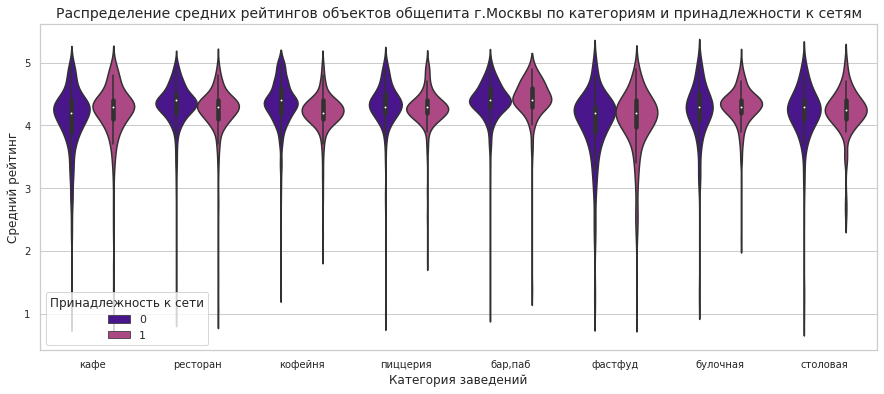

In [99]:
plt.figure(figsize=(15,6))

sns.violinplot(x='new_cat', y='rating', hue='chain', data=data, palette = ['#46039f', "#bd3786"])
# Пробовала добавить параметр split=True, но с ним график показался менее информативным. 
# В частности, не виден разброс в выбросах между сетевыми и несетевыми заведениями.

plt.title('Распределение средних рейтингов объектов общепита г.Москвы по категориям и принадлежности к сетям', fontsize=14)
plt.legend(title = "Принадлежность к сети")

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12);

# Ниже - первоначальная визуализация средних рейтингов объектов общепита
# по категориям и принадлежности к сетям через stripplot. Менее информативна. 
# sns.stripplot(data=data, y="rating", x="new_cat", hue="chain", palette = ['#46039f', '#de7065ff'])

# Две строки ниже - нереализованная идея, как можно было бы улучшить идею со stripplot.
# - df_counts = df.groupby(['hwy', 'cty']).size().reset_index(name='counts')
# - sns.scatterplot(df_counts.cty, df_counts.hwy, size=df_counts.counts*2, ax=ax)

- Сетевые кофейни, пиццерии, булочные и столовые имеют меньше крайне низких оценок, чем несетевые (на графике выше это отражает более короткий "хвост" выбросов). 
- При этом интересно отметить, что среднее значение средних рейтингов сетевых кофеен ниже, чем несетевых (см. на белую точку на графике). То же самое характерно и для ресторанов.
- Среди сетевых и несетевых кафе, ресторанов и заведений фастфуда наличие крайне низких оценок-выбросов не различается в зависимости от принадлежности или непринадлежности к сети. Для несетевых и сетевых баров/пабов различия минимальны.

Поскольку в данных о рейтингах заведений есть выбросы, в качестве меры среднего для анализа усреднённых рейтингов по категориям лучше использовать медиану.   
Посмотрим на медианы средних рейтингов по каждой из категорий.

In [100]:
rates_by_category = (data.pivot_table(values='rating', index='new_cat', aggfunc='median')
                     .sort_values(by='rating', ascending = False).reset_index())
rates_by_category

,new_cat,rating
0,"бар,паб",4.4
1,булочная,4.3
2,кофейня,4.3
3,пиццерия,4.3
4,ресторан,4.3
5,столовая,4.3
6,кафе,4.2
7,фастфуд,4.2


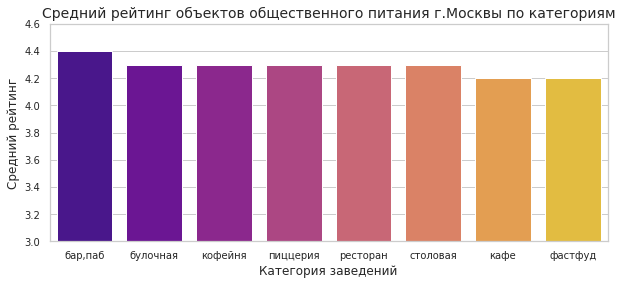

In [101]:
plt.figure(figsize=(10,4))

sns.barplot(x = 'new_cat', y = 'rating', data = rates_by_category, palette= 'plasma')
plt.title('Средний рейтинг объектов общественного питания г.Москвы по категориям', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.ylim(3,4.6)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12);

- Медианные значения средних рейтингов не имеют значительных различий в зависимости от категории заведения.
- Медианная оценка лидирующей категории - баров/пабов - 4.4, выше, чем у других заведений, но только на 1-2 десятых значения.
- Соответственно, медианная оценка отстающих категорий - кафе и фастфуда - 4.2, только на 1-2 десятых значения ниже, чем у других категорий.

#### Средний рейтинг заведений каждого административного округа

Построим фоновую картограмму (Choropleth) со средним (медианным) рейтингом заведений каждого административного округа Москвы.

In [102]:
ratings_by_district = data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending = False)
ratings_by_district

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [103]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=ratings_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Средний (медианный) рейтинг заведений общественного питания не имеет существенных различий по округам:
- Он несколько выше в Центральном административном округе и составляет 4.4.
- Наиболее низок медианный рейтинг в Северо-Восточном и Юго-Восточном административном округах и составляет 4.2.
- Во всех остальных административных округах Москвы медианный рейтинг заведений общественного питания одинаков и составляет 4.3.

#### Все заведения датасета на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [104]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,создаёт маркер в текущей точке
# и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Карта позволяет оценить емкость кластеров заведений в зависимости от их локации.  
Как мы видим, два наиболее крупных кластера - по 1982 и 1387 заведений - расположены в центре.  
Наименее емкие кластеры с точки зрения количества заведений расположены на юге и юго-востоке Москвы.

#### Распределение заведений по улицам

Проанализируем, на каких улицах расположено наибольшее количество заведений общепита.  
Найдем топ-15 улиц по количеству заведений.

In [105]:
objects_per_street = data['street'].value_counts().reset_index()
objects_per_street.columns = ['street', 'num_of_objects']
objects_per_street_top15 = objects_per_street.sort_values(by = 'num_of_objects', ascending = False).head(15)

objects_per_street_top15

,street,num_of_objects
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


В  топ-15 улиц по количеству заведений общепита входят многие вылетные магистрали Москвы — шоссе, проспекты, улицы, ведущие из центра города за его пределы; за городом они переходят в скоростные трассы.

К числу вылетных магистралей, вошедших в топ-15, относятся:   
проспект Мира (184), Профсоюзная улица (122), проспект Вернадского (108), Ленинский проспект (107),  Дмитровское шоссе (88), Каширское шоссе (77), Варшавское шоссе (76), Ленинградское шоссе (70), Люблинская улица (60), Кутузовский проспект (54).   
В скобках для каждой из них указано число расположенных там заведений общепита.    
Вероятно, их вхождение в топ-15 по количеству объектов обусловлено более высокой протяженностью, чем у обычных улиц.

Также в топ-15 вошли несколько улиц, не являющихся вылетными магистралями, а именно: 
- Ленинградский проспект (95 объектов; на этой улице расположен крупнейший в Европе по общей площади и второй по арендопригодной площади ТЦ Авиапарк),
- улица Вавилова (55 объектов),
- улица Миклухо-Маклая (49 объектов),
- Пятницкая улица (48 объектов).

Также в наш топ-15 вошел МКАД, который формально улицей не является. На нем расположено 65 объектов общепита.

Построим график распределения количества заведений и их категорий по топ-15 улицам.

In [106]:
top15_streets = objects_per_street_top15['street'].to_list()
top15_streets_df = data.loc[data['street'].isin(top15_streets)]

top15_streets_df_grouped = top15_streets_df.groupby(['street', 'category']).agg('count').reset_index()
top15_streets_df_grouped = top15_streets_df_grouped[['street', 'category', 'name']].sort_values(by='name', ascending = False)
top15_streets_df_grouped.columns = ['street', 'category', 'num_of_objects']

In [107]:

fig = px.histogram(top15_streets_df_grouped, x="num_of_objects", y="street", color="category",
            title="Распределение заведений общепита по категориям на топ-15 популярных улиц",
            width=900, height=500,
            labels={ # replaces default labels by column name
                    "category": "Категория заведения",  "street": "Топ-15 улиц по количеству заведений",
                    "num_of_objects": 'Количество объектов общепита'},
        
            #color_discrete_sequence= px.colors.sequential.Plasma,
            color_discrete_map=({"кофейня": "MediumPurple", "бар,паб": "#bd3786",
                                "булочная":"#0d0887", "кафе": "#de7065", "пиццерия" : "#ed7953",
                                "ресторан": "#fdca26", "фастфуд":"#7201a8", "столовая": "#b8627d"}), 
                                # replaces default color mapping by value
            template="simple_white"
            )
fig.update_layout(yaxis={'categoryorder':'sum ascending'}, xaxis_title="Количество заведений")
fig.show();

- Улицей с наибольшим количеством заведений является проспект Мира. Проспект Мира лидирует как по общему числу расположенных там заведений, так и по заведениям отдельных категорий, кроме столовых, пиццерий и баров.
- Больше всего баров и пабов из топ 15 улиц расположено на Ленинградском проспекте, больше всего столовых - на Варшавском шоссе, а больше всего пиццерий - на Профсоюзной улице.
- С точки зрения количества расположенных на нем кафе выделяется также МКАД.

#### Улицы с единственным объектом общепита

Найдем улицы, на которых находится только один объект общепита.

In [108]:
objects_per_street.query('num_of_objects == 1')['street'].count()

458

В массиве есть 458 улиц, на которых находится по одному объекту общепита.  
Посмотрим, что можно сказать об этих заведениях. Прежде всего, оценим, к какой категории они относятся.

In [109]:
# Создаем массив, в котором отобраны только заведения, расположенные на улицах с одним объектом

one_object_streets = objects_per_street.query('num_of_objects == 1')['street']
one_object_streets_objects = data.query('street in @one_object_streets')

# Первым шагом смотрим на тип этих заведений

objects_num_by_type_one = round(one_object_streets_objects['new_cat'].value_counts() 
                           / one_object_streets_objects['new_cat'].count() *100, 1).reset_index()
objects_num_by_type_one.columns = ['category', 'share']
objects_num_by_type_one

,category,share
0,кафе,34.7
1,ресторан,20.1
2,кофейня,18.3
3,"бар,паб",8.3
4,столовая,7.9
5,фастфуд,5.0
6,пиццерия,3.7
7,булочная,2.0


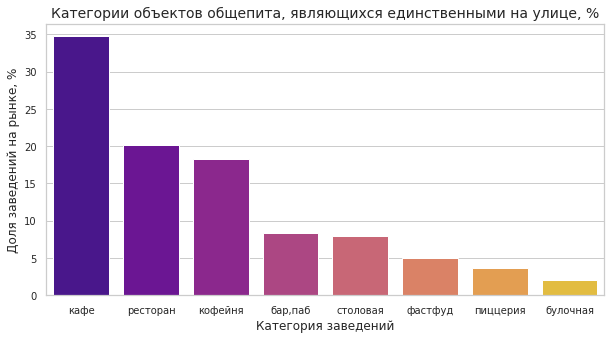

In [110]:
plt.figure(figsize=(10,5))

sns.barplot(x = 'category', y = 'share', data = objects_num_by_type_one, palette= 'plasma')
plt.title('Категории объектов общепита, являющихся единственными на улице, %', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Доля заведений на рынке, %', fontsize=12);

- Чаще всего единственным расположенным на улице заведением являются кафе. Их доля среди одиночных заведений составляет 34.7%.
- В 20.1% случаев единственным заведением на улице является ресторан, а в 18.3% - кофейня.
- В 8.3% случаев единственное заведение на улице - это бар или паб, в 7.9% - столовая.
- Остальные категории заведений представлены как единственное заведение на улице в 5% случаев и менее.

Теперь посмотрим, какова доля сетевых и несетевых объектов среди единственных расположенных на улице заведений.

In [111]:
objects_num_by_chain_one = round(one_object_streets_objects['chain'].value_counts() / one_object_streets_objects['new_cat']
                           .count(),2).reset_index()
objects_num_by_chain_one.columns = ['is_chain', 'share']
objects_num_by_chain_one

,is_chain,share
0,0,0.74
1,1,0.26


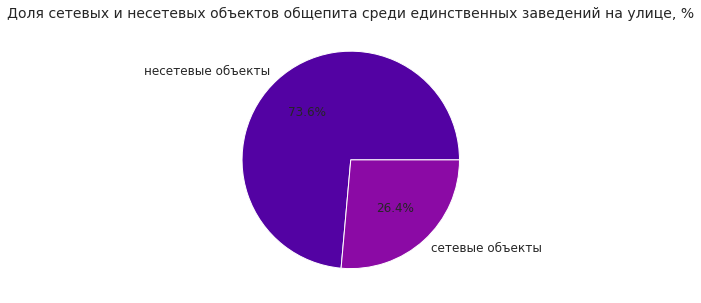

In [112]:
plt.figure(figsize=(10,5))

colors = sns.color_palette('plasma')
nums = one_object_streets_objects['chain'].value_counts().reset_index()

numbers = list(nums['chain'])
#labels = list(['несетевые объекты', 'сетевые объекты'])

plt.pie(numbers, labels = labels, colors = colors, autopct='%.1f%%', textprops={'fontsize': 12})
plt.title('Доля сетевых и несетевых объектов общепита среди единственных заведений на улице, %', fontsize=14);

Доля несетевых объектов среди единственных заведений на улице составляет 73.6%, а доля сетевых объектов - 26.4%.  
Если сравнивать с данными по массиву в целом, то доля несетевых объектов в данной выборке на 10.5% выше (а доля сетевых, соответственно, на 10.5% ниже), чем в целом по датафрейму.

Посмотрим, в каких административных округах Москвы расположены улицы, на которых присутствует только одно заведение общепита.

In [113]:
one_object_streets_by_district = (one_object_streets_objects.pivot_table(index = 'district',
                                                                        values= 'name', 
                                                                        aggfunc= 'count').sort_values(by='name', ascending = False)
                                                                        .reset_index())
                                                                        
one_object_streets_by_district.columns = ['district', 'num_of_objects']
one_object_streets_by_district 

,district,num_of_objects
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


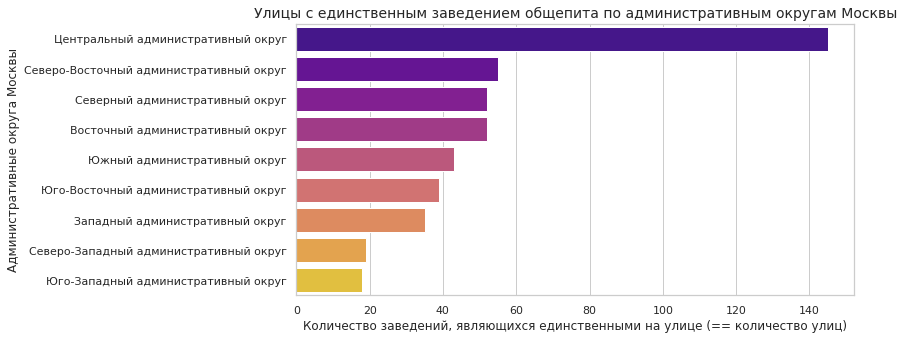

In [114]:
plt.figure(figsize=(10,5))

sns.barplot(x="num_of_objects", y="district", data=one_object_streets_by_district , palette= 'plasma', ci= None,
           order = ['Центральный административный округ', 'Северо-Восточный административный округ',
                    'Северный административный округ', 'Восточный административный округ',
                    'Южный административный округ', 'Юго-Восточный административный округ', 
                    'Западный административный округ', 
                    'Северо-Западный административный округ', 'Юго-Западный административный округ'])

plt.title('Улицы с единственным заведением общепита по административным округам Москвы', fontsize=14)

plt.xticks(rotation=0, fontsize=11)
plt.yticks(fontsize=11)

plt.xlabel('Количество заведений, являющихся единственными на улице (== количество улиц)', fontsize=12)
plt.ylabel('Административные округа Москвы', fontsize=12);

- В абсолютном отношении наибольшее количество улиц с единственным заведением приходится на Центральный административный округ Москвы. Однако в этом округе в принципе расположено наибольшее количество заведений общепита, что может искажать общую картину.
- Далее следуют Северо-Восточный, Северный и Восточный административные округа. Вероятно, северо-восток Москвы и есть та зона, где улицы с единственным заведением общепита расположены наиболее часто (однако это утверждение требует дополнительной проверки).
- Реже всего улицы с единственным заведением встречаются на западе Москвы - в Западном, Северо-Западном и Юго-Западном административных округах.

Посмотрим соотношение единственных расположенных на улице объектов к общему количеству объектов в том или ином административном округе.

In [115]:
total_objects_by_district = data['district'].value_counts().reset_index()
total_objects_by_district.columns = ['district', 'total_num_of_objs']
one_object_streets_by_district = one_object_streets_by_district.merge(total_objects_by_district)
one_object_streets_by_district['share, %'] = round(one_object_streets_by_district['num_of_objects'] / 
                                           one_object_streets_by_district['total_num_of_objs']*100, 1)
one_object_streets_by_district.sort_values(by='share, %', ascending=False)

,district,num_of_objects,total_num_of_objs,"share, %"
0,Центральный административный округ,145,2242,6.5
2,Восточный административный округ,52,798,6.5
1,Северо-Восточный административный округ,55,891,6.2
3,Северный административный округ,52,900,5.8
5,Юго-Восточный административный округ,39,714,5.5
4,Южный административный округ,43,892,4.8
7,Северо-Западный административный округ,19,409,4.6
6,Западный административный округ,35,851,4.1
8,Юго-Западный административный округ,18,709,2.5


Как мы видим, если рассматривать соотношение единственных расположенных на улице объектов к общему количеству объектов в том или ином административном округе, первичный вывод окажется близок к истине:

- Наибольшее количество объектов, являющихся единственным заведением на улице, приходится на Центральный административный округ и Восточный административный округ Москвы (по 6.5% единственных на улице объектов в каждом из этих округов);
- Совокупный северо-восток Москвы, представленный Восточным, Северо-Восточным и Северным округами, имеет более высокие доли единственных расположенных на улице объектов (5.8 - 6.5%), чем совокупный запад города, представленный Северо-Западным, Западным и Юго-Западным округами (2.5 - 4.6%).
- Отдельно стоит отметить Юго-Западный административный округ - в нем доля единственных объектов на улице наиболее низка (всего 2.5%).

#### Средний чек по районам

Рассмотрим, каковы средние чеки заведений в датафрейме. 

Значения средних чеков хранятся в столбце middle_avg_bill. Они показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района.

In [116]:
median_bills = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending = False)
median_bills

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


- Наиболее высокий средний чек характерен для заведений Западного и Центрального административных округов Москвы. В каждом из этих округов он составляет 1000 руб.
- Далее следует Северо-Западный административный округ, где средний чек заведений составляет 700 руб.
- В Восточном, Юго-Западном и Северном округах средний чек варьируется от 575 до 650 руб.
- Наиболее низкий средний чек - от 450 до 500 руб. - характерен для заведений Юго-Восточного, Южного и Северо-Восточного административных округов. 

Используем полученные медианные значения в качестве ценового индикатора районов.  
Построим фоновую картограмму (Choropleth) со средним чеком заведений по административным округам Москвы. 

In [117]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bills,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по административным округам',
).add_to(m)

# выводим карту
m

На карте мы наглядно видим, что цены в заведениях наиболее высоки в наиболее престижных локациях в центре и на западе города - в Центральном и Западном административных округах.  
Далее следуют Северо-Западный и Северный административный округа, для которых характерна преимущественно новая застройка и неплохая экологическая ситуация, что, вероятно, делает эти районы востребованными для проживания среди горожан среднего класса.  
Чуть ниже цены в заведениях в Юго-Западном и Восточном административных округах.  
Наиболее низкий средний чек характерен для заведений Юго-Восточного, Южного и Северо-Восточного административных округов - на месте исторически существовавших рабочих кластеров города. 

В качестве дополнительного исследования было бы интересно сравнить средний чек заведений и средние цены на недвижимость в различных административных округах, что, вероятно, помогло бы нам подтвердить высказанные выше гипотезы.

#### Часы работы заведений в зависимости от категории и расположения

Проанализируем часы работы заведений и их зависимость от расположения и категории заведения.  
Первым шагом рассмотрим соотношение круглосуточных и некруглосуточных заведений в датасете. 

In [118]:
objects_num_by_time = (data['is_24/7'].value_counts() / objects_total).reset_index()
objects_num_by_time.columns = ['is_24/7', 'share']
objects_num_by_time

,is_24/7,share
0,False,0.913276
1,True,0.086724


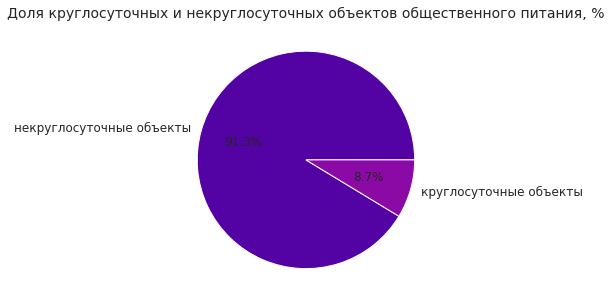

In [119]:
plt.figure(figsize=(10,5))

colors = sns.color_palette('plasma')
nums = data['is_24/7'].value_counts().reset_index()

numbers = list(nums['is_24/7'])
labels = list(['некруглосуточные объекты', 'круглосуточные объекты'])

plt.pie(numbers, labels = labels, colors = colors, autopct='%.1f%%', textprops={'fontsize': 12})
plt.title('Доля круглосуточных и некруглосуточных объектов общественного питания, %', fontsize=14);

Большинство заведений в датафрейме (91.3%) не являются круглосуточными.  
Доля круглосуточных заведений составляет 8.7%.

Посмотрим, какова доля круглосуточных заведений в рамках отдельных категорий.

In [120]:
share_of_24_7_by_cat = (data.pivot_table(index='new_cat',values='is_24/7',aggfunc=np.mean)
                        .sort_values(by='is_24/7', ascending = False).reset_index())
share_of_24_7_by_cat.columns = ['category', 'share_of_24/7']
share_of_24_7_by_cat

,category,share_of_24/7
0,фастфуд,0.258824
1,кафе,0.107187
2,булочная,0.085185
3,"бар,паб",0.067282
4,ресторан,0.064388
5,кофейня,0.051590
6,пиццерия,0.049051
7,столовая,0.029032


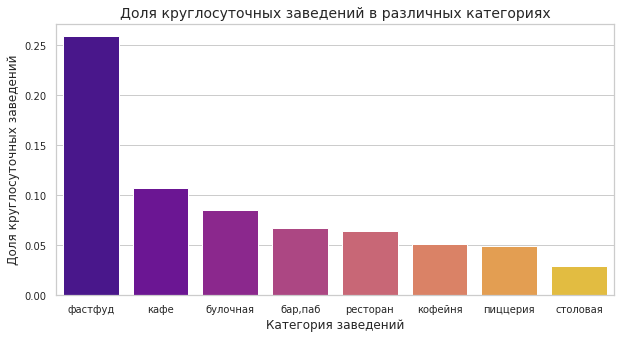

In [121]:
plt.figure(figsize=(10,5))

sns.barplot(x="new_cat", y="is_24/7", data=data, palette= 'plasma',  ci=None, order=["фастфуд", "кафе", "булочная", 
                                                                                     "бар,паб", "ресторан", "кофейня",
                                                                                     "пиццерия", "столовая"]);
                                                
#sns.barplot(x="category", y="chain", data=data, palette= 'plasma')
#проверка, насколько отличаются данные после очистки категорий по сетям

plt.title('Доля круглосуточных заведений в различных категориях', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Доля круглосуточных заведений', fontsize=12);

- Наиболее высока доля круглосуточных заведений в категории фастфуда (25.9%).
- Далее следуют кафе с 10.7% круглосуточных заведений и булочные с 8.5% круглосуточных заведений (что несколько странно). 
- Доля круглосуточных баров и пабов составляет 6.7%, а ресторанов - 6.4%.
- Доля круглосуточных кофеен равна 5.2%, пиццерий - 4.9%.
- Меньше всего круглосуточных объектов в категории столовых - 2.9%.

Посмотрим, как круглосуточные заведения распределены по административным округам Москвы.

In [122]:
share_of_24_7_by_district = (data.pivot_table(index='district',values='is_24/7',aggfunc=np.mean)
                             .sort_values(by='is_24/7', ascending = False).reset_index())
share_of_24_7_by_district.columns = ['district', 'share_of_24/7']
share_of_24_7_by_district

,district,share_of_24/7
0,Юго-Восточный административный округ,0.130252
1,Восточный административный округ,0.121554
2,Северо-Западный административный округ,0.105134
3,Юго-Западный административный округ,0.102962
4,Западный административный округ,0.084606
5,Северо-Восточный административный округ,0.084175
6,Южный административный округ,0.082960
7,Северный административный округ,0.078889
8,Центральный административный округ,0.058430


- Лидерами по распространенности круглосуточных заведений общественного питания являются Юго-Восточный и Восточный административные округа. Доля круглосуточных заведений там составляет 13.0% и 12.2% соответственно.
- Наименьшая доля круглосуточных заведений общественного питания характерна для Центрального административного округа. Она составляет 5.8%. 

Посмотрим, как данные о часах работы заведений выглядят на карте.

In [123]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=share_of_24_7_by_district,
    columns=['district', 'share_of_24/7'],
    key_on='feature.name',
    fill_color='YlGn',
    # Пробовала использовать цветовую схему Purples, но YlGn на этой конкретной карте смотрится лучше.
    fill_opacity=0.8,
    legend_name='Количество круглосуточных заведений по административным округам',
).add_to(m)

# выводим карту
m

Как мы уже отметили выше, наибольшая доля круглосуточных заведений характерна для Восточного и Юго-Восточного округов.   
Наименьшая доля - для Центрального административного округа. Также низка доля круглосуточных заведений в Северном, Западном, Южном и Северо-Восточном округах. Вероятно, это каким-то образом связано с распределением офисных центров и иных точек притяжения, рядом с которыми могут открываться объекты общепита, ориентированные на дневное время работы, в рамках того или иного округа. 

#### Вывод

На этапе анализа данных мы выявили следующие <b>особенности рынка заведений общественного питания Москвы</b>:

1) Распределение объектов общепита по категориям имеет следующий вид:

- <b>Наиболее распространенной категорией объектов общественного питания являются кафе. Их доля составляет 28.6% </b>.
-  Далее следуют рестораны - их доля равна 24.0%.
- В топ-3 категорий заведений общественного питания также входят кофейни с долей рынка 16.8%.
- Доля пабов и баров от общего числа заведений общепита г.Москвы составляет 9.0%, доля пиццерий - 7.5%, а фастфуда – 7.1%.
- Наименее распространены столовые и булочные (3.7% и 3.2% рынка).

2) <b>На рынке Москвы преобладают несетевые заведения общественного питания. Их доля составляет 63.1%. 
    Доля сетевых объектов составляет 36.9% </b>.
- Доля сетевых заведений наиболее высока в категории булочных. Она составляет 61.9%.
-  Далее следуют пиццерии и кофейни. В этих категориях доля сетевых заведений составляет 54.3% и 51.7% соответственно.
- Доля сетевых заведений в категории фастфуда – 35.6%. В категории ресторанов - 33.8%, в категории кафе - 30.2%. 
- Чуть меньше сетевых заведений в категории столовых – 27.1%.
- Наименьшая доля сетевых заведений - 20.7% - характерна для категории баров и пабов.

3) <b>Лидерами среди сетевых заведений общественного питания, вошедшими  в топ-15  по количеству объектов, являются достаточно известные / массовые заведения</b>, в частности:

- кафе Му-Му, Prime, Cofefest, Кулинарная лавка братьев Караваевых; 
- пиццерии Домино'с Пицца и Додо Пицца; 
- кофейни Шоколадница, One Price Coffee и Cofix, Кофепорт, Wild Been Cafe, Drive Cafe; 
- фастфуд Теремок; 
- пекарня Буханка; 
- сервис доставки готовой еды Яндекс.Лавка. 


<b>Они относятся к различным категориям заведений общепита. Однако преобладают в этом списке кофейни</b>.


- <b>Наиболее крупной сетью по количеству заведений является кофейня Шоколадница (120 объектов)</b>. 
- Далее следуют пиццерии  Домино'с Пицца и Додо Пицца (77 и 74 объекта). 
- Четвертое место разделяют сервис доставки готовой еды Яндекс.Лавка и кофейня One Price Coffee (по 72 объекта).
- Далее следует кофейня Cofix (65 объектов) и кафе  Prime (50 объектов). 
- В остальных заведениях из топ-15 сетей менее 50 объектов.


4) Что касается <b>распределения объектов общепита из топ-15 сетей по категориям, определенным в датафрейме</b>: 

- <b>Среди топ-15 популярных сетей общепита по количеству заведений лидируют кофейни (358 объектов)</b>. 
- Далее следуют рестораны (160 объектов) и пиццерии (151 объект). 
- На кафе приходится 90 объектов, и на булочные - 32 объекта. 


Интересно отметить, что в этой группировке нет  категории "фастфуд", куда логически можно отнести Теремок, однако появляется категория "рестораны", в которую логически не попадает ничего из списка топ-15 заведений. 

Нюанс заключается в том, что в исходном датафрейме практически во всех случаях Теремок размечен как ресторан. Именно поэтому нам не удалось при формировании столбца new_cat присвоить ему ту категорию, которая кажется наиболее подходящей для этой сети.  
Кроме того, все объекты сервиса доставки готовой еды Яндекс.Лавка, который логически не подходит ни под одну из категорий, имевшихся в исходном датафрейме, отнесены к категории “рестораны”.  Куда эту сеть на самом деле стоит отнести в рамках исходной категоризации - вопрос спорный. 

На данном этапе мы не будем исправлять принадлежность Теремка и Яндекс.Лавки к категории ресторанов (в рамках учебного проекта сочтем их погрешностью).

Однако в случае реального проекта необходимо было бы получить более полную документацию относительно того, как формировался исходный датафрейм, и по какому принципу заведениям в нем присваивались те или иные категории. Вероятно, при подробном ознакомлении с документацией нам пришлось бы полностью переопределить принципы отнесения заведений к тем или иным категориям для их соответствия логике и задачам нашего проекта.


5) Что касается общего количества заведений и количества заведений каждой категории по районам на основании топ-15 сетей:

- <b>Наибольшее количество заведений из топ-15 сетей (210 объектов) сосредоточено в Центральном административном округе. Оно более чем в два раза превышает количество заведений из топ-15 сетей в любом из других округов Москвы</b>. 

- Далее следует кластер округов с близким количеством заведений из топ-15 сетей: Северный, Северо-Восточный, Южный, Западный (90-84 объекта). 
- Следующий кластер представлен Восточным и Юго-Западным административными округами - в них расположено 75 и 69 заведений из топ-15 сетей соответственно. 
- Наименее представлены заведения из топ-15 сетей в Северо-Западном и Юго-Восточном административных округах (46 и 45 объектов).


- <b>Кофейни являются ключевым типом заведений из топ-15 сетей во всех административных округах: количество кофеен больше, чем количество объектов других категорий, во всех округах </b>. 
- <b>Наибольшее количество кофеен, а также наибольшее количество кафе и ресторанов из топ-15 сетей сосредоточено в ЦАО</b>. 
- В ЦАО минимальное количество сетевых пиццерий и крайне мало сетевых булочных по сравнению с другими административными округами Москвы. 
- В ЮВАО сетевых кафе и булочных из топ-15 сетей нет вообще. 


6) Распределение заведений общепита в целом по административным округам Москвы имеет следующий вид:

- <b>Наибольшее количество заведений общественного питания - как в целом, так и по каждой из категорий в отдельности - приходится на Центральный административный округ. В этом округе находится 2242 заведений общепита. Это более чем в 2 раза больше, чем количество объектов общепита в любом другом административном округе </b>. 
- Далее следует кластер из Северного, Южного и Северо-Восточного административных округов. Количество объектов общественного питания в них составляет от 891 до 900 объектов. 
- Следующий кластер - это Западный и Восточный административные округа с 851 и 798 объектами соответственно. 
- Далее следуют Юго-Восточный и Юго-Западный округа, где расположено 714 и 709 объектов соответственно. 
- <b>Наименьшее количество объектов общественного питания (409) приходится на Северо-Западный административный округ Москвы</b>. 

-<b>В Центральном административном округе наиболее распространенной категорией являются рестораны. Далее следуют кафе, кофейни и бары/пабы. Во всех остальных административных округах наиболее распространенной категорией являются кафе. Далее следуют рестораны и кофейни </b>. 

7) <b>Средний рейтинг заведений общепита по датафрейму в целом</b> варьируется от 1 до 5. При этом значения до 3.7 и от 4.8 являются выбросами, или крайне нетипичными, редко встречающимися оценками. Среднее от средних рейтингов (верхняя граница 2 квартиля) <b>составляет 4.3</b>.

Если говорить о распределении средних рейтингов по категориям заведений:

- Средние оценки заведений практически всех категорий являются смещенными в более высокую часть шкалы. Это значит, что в целом клиенты склонны оценивать заведения общественного питания скорее положительно. 
- Рестораны и кофейни оцениваются клиентами более однозначно, чем заведения других категорий: их график распределения более узкий, чем в остальных случаях, а значит - значения более гомогенны. 
- Разброс в оценках кафе более значителен, чем в других категориях - график распределения в этом случае более широкий. Кафе чаще, чем заведения других категорий, имеют средние оценки, находящиеся в промежутке от 2 до 4. 
- Бары / пабы, вероятно, имеют более высокую усредненную оценку среднего рейтинга, чем другие типы заведений (данные больше смещены к верхней части шкалы). 
- Заведения фастфуда, наоборот, имеют скорее более низкую усредненную оценку среднего рейтинга, чем завдения других категорий (данные больше смещены к нижней части шкалы). 
- Сетевые кофейни, пиццерии, булочные и столовые имеют меньше крайне низких оценок, чем несетевые (более короткий "хвост" выбросов). Среди сетевых и несетевых кафе, ресторанов и заведений фастфуда наличие крайне низких оценок-выбросов не различается в зависимости от принадлежности или непринадлежности к сети. Для несетевых и сетевых баров/пабов различия минимальны. 
- Среднее значение средних рейтингов сетевых кофеен ниже, чем несетевых. То же самое характерно и для ресторанов.


- <b>Медианные значения средних рейтингов не имеют значительных различий в зависимости от категории заведения.  Медианная оценка лидирующей категории - баров/пабов - 4.4, выше, чем у других заведений, но только на 1-2 десятых значения</b>. Соответственно, медианная оценка отстающих категорий - кафе и фастфуда - 4.2, только на 1-2 десятых значения ниже, чем у других категорий. Все остальные категории имеют медианную оценку 4.3. <b>Без разделения на сетевые и несетевые заведения различий в средних оценках между категориями практически нет</b>.
      
- <b>Средний (медианный) рейтинг заведений каждого административного округа Москвы также не имеет существенных различий. Для Центрального административного округа он равен  4.4.  Для Северо-Восточного и Юго-Восточного административных округов – 4.2, а для всех остальных округов – 4.3 </b>.


8) <b>В  топ-15 улиц по количеству заведений общепита входят многие вылетные магистрали Москвы — шоссе, проспекты, улицы, ведущие из центра города за его пределы; за городом они переходят в скоростные трассы </b>.

К числу вылетных магистралей, вошедших в топ-15, относятся:  
проспект Мира (184), Профсоюзная улица (122), проспект Вернадского (108), Ленинский проспект (107),  Дмитровское шоссе (88), Каширское шоссе (77), Варшавское шоссе (76), Ленинградское шоссе (70), Люблинская улица (60), Кутузовский проспект (54). В скобках для каждой из них указано число расположенных там заведений общепита. 

Вероятно, их вхождение в топ-15 по количеству объектов обусловлено более высокой протяженностью, чем у обычных улиц.

Также в топ-15 вошли несколько улиц, не являющихся вылетными магистралями, а именно: 
- Ленинградский проспект (95 объектов; на этой улице расположен крупнейший в Европе по общей площади и второй по арендопригодной площади ТЦ Авиапарк).
- улица Вавилова (55 объектов),
- улица Миклухо-Маклая (49 объектов),
- Пятницкая улица (48 объектов).

Также в наш топ-15 вошел МКАД, который формально улицей не является. На нем расположено 65 объектов общепита.

- <b>Улицей с наибольшим количеством заведений является проспект Мира. Он лидирует как по общему числу расположенных там заведений, так и по заведениям отдельных категорий, кроме столовых, пиццерий и баров </b>. 
- Больше всего баров и пабов из топ 15 улиц расположено на Ленинградском проспекте, больше всего столовых - на Варшавском шоссе, а больше всего пиццерий - на Профсоюзной улице. 
      
      
9) <b>В массиве есть 458 улиц, на которых находится по одному объекту общепита</b>.

- <b>Чаще всего единственным расположенным на улице заведением являются кафе. Их доля среди одиночных заведений - 34.7%</b>. 
- В 20.1% случаев единственным заведением на улице является ресторан, а в 18.3% - кофейня.  
- В 8.3% случаев единственное заведение на улице - это бар или паб, в 7.9% - столовая.  
- Остальные категории заведений представлены как единственное заведение на улице в 5% случаев и менее.
- <b>Доля несетевых объектов среди единственных заведений на улице составляет 73.6%, а доля сетевых объектов – 26.4% </b>. Если сравнивать с данными по массиву в целом, то доля несетевых объектов в данной выборке на 10.5% выше (а доля сетевых, соответственно, на 10.5% ниже), чем в целом по датафрейму.
- <b>В абсолютном отношении наибольшее количество улиц с единственным заведением приходится на Центральный административный округ Москвы (145 заведений)</b>. Однако в этом округе в принципе расположено наибольшее количество заведений общепита, что может искажать общую картину.  Далее следуют Северо-Восточный, Северный и Восточный административные округа (по 52-55 заведений на округ). Вероятно, северо-восток Москвы и есть та зона, где улицы с единственным заведением общепита расположены наиболее часто. Реже всего улицы с единственным заведением встречаются на западе Москвы - в Западном, Северо-Западном и Юго-Западном административных округах (по 18-35 заведений на округ).
- <b>Если рассматривать соотношение единственных расположенных на улице объектов к общему количеству объектов в том или ином административном округе</b>, первичный вывод окажется близок к истине. <b>Наибольшее количество объектов, являющихся единственным заведением на улице, приходится на Центральный и Восточный административные округа Москвы (по 6.5% единственных на улице объектов в каждом из этих округов). 
- Совокупный северо-восток Москвы, представленный Восточным, Северо-Восточным и Северным округами, имеет более высокие доли единственных расположенных на улице объектов (5.8 - 6.5%), чем совокупный запад города, представленный Северо-Западным, Западным и Юго-Западным округами (2.5 - 4.6%) </b>. 
- Отдельно стоит отметить Юго-Западный административный округ - в нем доля единственных объектов на улице наиболее низка (всего 2.5%). 
    
    
10) <b>Наиболее высокий медианный средний чек -1000 руб. - характерен для заведений, расположенных в престижных локациях – в Западном и Центральном административных округах Москвы</b>.  

- Далее следует Северо-Западный административный округ, где средний чек заведений составляет 700 руб.  
- В Восточном, Юго-Западном и Северном округах средний чек варьируется от 575 до 650 руб. 
- <b>Наиболее низкий средний чек - от 450 до 500 руб. - характерен для заведений Юго-Восточного, Южного и Северо-Восточного административных округов, где исторически существовали рабочие кластеры города </b>. 


11) <b>Большинство заведений в датафрейме (91.3%) не являются круглосуточными. Доля круглосуточных заведений составляет 8.7%</b>.
- <b>Наиболее высока доля круглосуточных заведений в категории фастфуда (25.9%)</b>. 
- Далее следуют кафе с 10.7% круглосуточных заведений и булочные с 8.5% круглосуточных заведений (что несколько странно). 
- Доля круглосуточных баров и пабов составляет 6.7%, а ресторанов - 6.4%. 
- Доля круглосуточных кофеен равна 5.2%, пиццерий - 4.9%. 
- Меньше всего круглосуточных объектов в категории столовых - 2.9%. 

<b>Лидерами по доле круглосуточных заведений общественного питания являются Юго-Восточный и Восточный административные округа: доля круглосуточных заведений там составляет 13.0% и 12.2%. Наименьшая доля круглосуточных заведений общепита - 5.8% -  характерна для Центрального административного округа</b>.  
Также низка доля круглосуточных заведений в Северном, Западном, Южном и Северо-Восточном округах. Вероятно, это каким-то образом связано с распределением офисных центров и иных точек притяжения, рядом с которыми могут открываться объекты общепита, ориентированные на дневное время работы, в рамках того или иного округа. 

12)  <b>Данные в столбце seats требуют серьезной проверки и - вероятно - перевыгрузки</b>.
В них встречается достаточно много объектов с очень высоким количеством посадочных мест, которое зачастую логически не соответствует категории заведения (сложно, например, представить пиццерию или булочную вместимостью в 200-300 мест).
Кроме того, как показала выборочная проверка по открытым источникам информации, во многих случаях данные - вне зависимости от категории заведений - действительно оказываются ошибочными. Использовать данные о количестве мест в заведениях в том виде, в каком они есть, нельзя. В условиях реального проекта необходимо было бы выяснить, почему в столбце так много ошибочных данных (с учетом всех найденных в ходе предобработки ошибок), и перевыгрузить данный столбец. <b>В рамках данного проекта мы не будем использовать данные из этого столбца для анализа рынка и формирования выводов</b>.

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве.   
Заказчики не боятся конкуренции в этой сфере, хотя кофеен в больших городах уже достаточно.
Определим, осуществима ли мечта клиентов.

Из изначального запроса на "крутую и доступную, как «Central Perk», кофейню" мы можем сделать вывод, что в дальнейшем исследовании особое внимание стоит уделить несетевым заведениям среднего ценового сегмента.

#### Количество кофеен в датасете и их распределение по районам

Посмотрим, сколько всего кофеен в датасете.

In [124]:
# Подсчет числа кофеен в исходном датафрейме.
data[data['category'] == 'кофейня']['category'].count()

1413

In [125]:
# Подсчет числа кофеен и доли кофеен от всех объектов датафрейма после приведения сетей к единым для них категориям.
print(data[data['new_cat'] == 'кофейня']['new_cat'].count())
print(round(data[data['new_cat'] == 'кофейня']['new_cat'].count() / data['new_cat'].count()*100, 2))

1415
16.83


В исходном датасете содержались данные о 1413 кофейнях.   
После того, как в процессе предобработки данных мы привели сети к единым для них категориям, число кофеен увеличилось до 1415, что составляет 16.8% от общего числа объектов в датафрейме.

Посмотрим, в каких административных округах расположено больше всего кофеен.

In [126]:
#Создадим отдельный датафрейм, содержащий только кофейни, чтоб далее работать с ним.
coffee = 'кофейня'
coffee_houses_df = data.query('new_cat == @coffee')

# Рассчитаем количество кофеен по административным округам.
coffee_by_district = (coffee_houses_df.groupby('district', as_index=False)['new_cat']
                      .agg('count').sort_values(by='new_cat', ascending = False))
coffee_by_district.columns = ['district', 'num_of_objects']
coffee_by_district['share'] = round(coffee_by_district['num_of_objects']/coffee_houses_df['district'].count(),2)

coffee_by_district

,district,num_of_objects,share
5,Центральный административный округ,429,0.30
2,Северный административный округ,193,0.14
3,Северо-Восточный административный округ,158,0.11
1,Западный административный округ,149,0.11
8,Южный административный округ,129,0.09
0,Восточный административный округ,105,0.07
7,Юго-Западный административный округ,98,0.07
6,Юго-Восточный административный округ,91,0.06
4,Северо-Западный административный округ,63,0.04


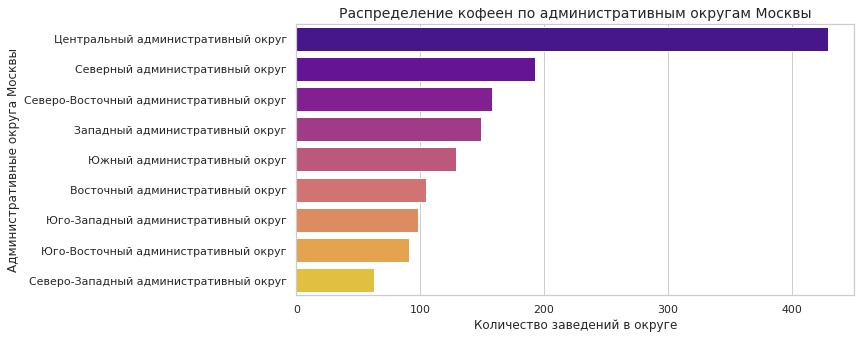

In [127]:
plt.figure(figsize=(10,5))

sns.barplot(x="num_of_objects", y="district", data=coffee_by_district, palette='plasma', ci=None)

plt.title('Распределение кофеен по административным округам Москвы', fontsize=14)

plt.xticks(rotation=0, fontsize=11)
plt.yticks(fontsize=11)

plt.xlabel('Количество заведений в округе', fontsize=12)
plt.ylabel('Административные округа Москвы', fontsize=12);

- Больше всего кофеен (429 объектов, или 30% от всех кофеен) расположено в Центральном административном округе. 
- Далее следует Северный административный округ, где расположено 14% от всех кофеен, а также кластер из Западного, Северо-Восточного и Южного округов, в которых количество кофеен варьируется от 129 до 158 (9-11% в каждом округе).
- Следующий кластер - Восточный, Юго-Западный и Юго-Восточный округа, где число кофеен составляет от 91 до 105 (6%- 7%).
- Наименьшее количество кофеен (63 объекта, или 4% от всех кофеен) расположено в Северо-Западном административном округе.

Нанесем полученные выше данные на карту.

In [128]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_by_district,
    columns=['district', 'num_of_objects'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по административным округам',
).add_to(m)

# выводим карту
m

- Больше всего кофеен расположено в Центральном административном округе, что, вероятно, может быть обусловлено большей проходимостью и большей концентрацией активностей, предполагающих потребление кофе (утром перед работой - для офисных работников, поскольку многие офисы расположены в центре; при прогулках по центру города; вечером для встреч с друзьями в удобной для всех локации).
- Также несколько больше кофеен, чем в остальных частях города, расположено в Северном административном округе, что также может быть связано с некоторой концентрацией там офисных зданий.
- Меньше всего кофеен расположено в Северо-Западном, Юго-Западном, Восточном и Юго-Восточном административных округах Москвы. Первые 2 округа включают, скорее, преимущественно спальные районы, а два последние - преимущественно старый кластер промзон.

#### Сетевые и несетевые кофейни

Рассмотрим долю сетевых и несетевых заведений в сегменте кофеен.

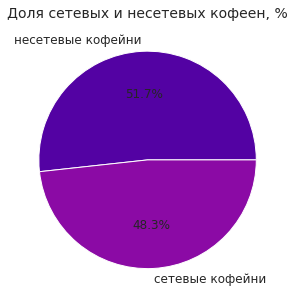

In [129]:
plt.figure(figsize=(10,5))

#define Seaborn color palette to use
colors = sns.color_palette('plasma')

nums = coffee_houses_df['chain'].value_counts().reset_index()

numbers = list(nums['chain'])
labels = list(['несетевые кофейни', 'сетевые кофейни'])

#create pie chart
plt.pie(numbers, labels = labels, colors = colors, autopct='%.1f%%', textprops={'fontsize': 12})
plt.title('Доля сетевых и несетевых кофеен, %', fontsize=14);

- Доля сетевых кофеен составляет 48.3%, доля несетевых – 51.7%.
- Доля сетевых объектов в категории кофеен является одной из самых высоких относительно других типов заведений. 
- Как мы видим, на рынке успешны как кофейни сетевого, так и несетевого формата. Поэтому мы не можем дать однозначную рекомендацию по выбору концепции заведения.

#### Часы работы кофеен

Проанализируем часы работы кофеен и их зависимость от расположения заведения.  
Первым шагом рассмотрим соотношение круглосуточных и некруглосуточных кофеен.

In [130]:
objects_num_by_time = (coffee_houses_df['is_24/7'].value_counts() / coffee_houses_df['name'].count()).reset_index()
objects_num_by_time.columns = ['is_24/7', 'share']
objects_num_by_time

,is_24/7,share
0,False,0.94841
1,True,0.05159


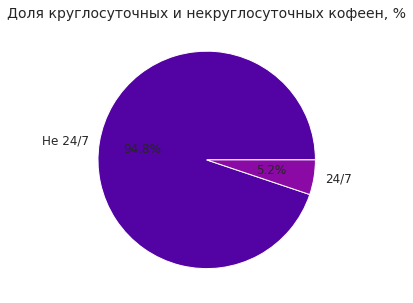

In [131]:
plt.figure(figsize=(10,5))

colors = sns.color_palette('plasma')
nums = coffee_houses_df['is_24/7'].value_counts().reset_index()

numbers = list(nums['is_24/7'])
labels = list(['Не 24/7', '24/7'])

plt.pie(numbers, labels=labels, colors = colors, autopct='%.1f%%', textprops={'fontsize': 12})
#plt.legend(labels, loc="best")
plt.title('Доля круглосуточных и некруглосуточных кофеен, %', fontsize=14);

- Доля круглосуточных кофеен составляет 5.2%, доля некруглосуточных - 94.8%.
- Таким образом, доля круглосуточных кофеен несколько меньше, чем доля круглосуточных объектов всех типов в датафрейме в целом (она, как мы помним, составляет 8.7%).
- Более того, как мы помним из раздела 4.13, доля круглосуточных объектов в категории кофеен является одной из самых низких относительно других типов заведений. Продублируем информацию из раздела 4.13 ниже:
    - Наиболее высока доля круглосуточных заведений в категории фастфуда (25.9%).
    - Далее следуют кафе с 10.7% круглосуточных заведений и булочные с 8.5% круглосуточных заведений.
    - Доля круглосуточных баров и пабов составляет 6.7%, а ресторанов - 6.4%.
    - Доля круглосуточных кофеен равна 5.2%, пиццерий - 4.9%.
    - Меньше всего круглосуточных объектов в категории столовых - 2.9%.

Очевидно, что в категории кофеен нет круглосуточного спроса, как и в категориях пиццерий и столовых (в отличие от фастфуда, где спрос есть круглосуточно). Таким образом, мы можем рекомендовать инвесторам не открывать круглосуточный объект.

На случай, если инвесторам будет интересен именно круглосуточный формат, посмотрим, как круглосуточные кофейни распределены по административным округам Москвы.
Там, где круглосуточных объектов больше, на круглосуточные объекты, вероятно, существует некий локальный ночной спрос - а значит, открывать новую круглосуточную кофейню логично именно там.

In [132]:
share_of_24_7_by_district = (coffee_houses_df.pivot_table(index='district',values='is_24/7',aggfunc=np.mean)
                             .sort_values(by='is_24/7', ascending = False).reset_index())
share_of_24_7_by_district.columns = ['district', 'share_of_24/7']
share_of_24_7_by_district

,district,share_of_24/7
0,Юго-Западный административный округ,0.122449
1,Западный административный округ,0.067114
2,Восточный административный округ,0.066667
3,Центральный административный округ,0.060606
4,Северо-Западный административный округ,0.047619
5,Северо-Восточный административный округ,0.037975
6,Юго-Восточный административный округ,0.032967
7,Северный административный округ,0.025907
8,Южный административный округ,0.007752


In [133]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=share_of_24_7_by_district,
    columns=['district', 'share_of_24/7'],
    key_on='feature.name',
    fill_color='YlGn',
    # Пробовала использовать цветовую схему Purples, но YlGn на этой конкретной карте смотрится лучше.
    fill_opacity=0.8,
    legend_name='Количество круглосуточных заведений по административным округам',
).add_to(m)

# выводим карту
m

- Наибольший процент круглосуточных кофеен характерен для Юго-Западного административного округа (12.2%).
- Далее следуют Западный и Восточный административные округа (по 6.7% круглосуточных кофеен), а также Центральный округ (6.1% круглосуточных кофеен).
- Наименьшая доля круглосуточных кофеен характерна для Южного административного округа (0.1%), а также для Северного административного округа (2.6%).

#### Рейтинги кофеен и их распределение по районам

Посмотрим на средние рейтинги кофеен.

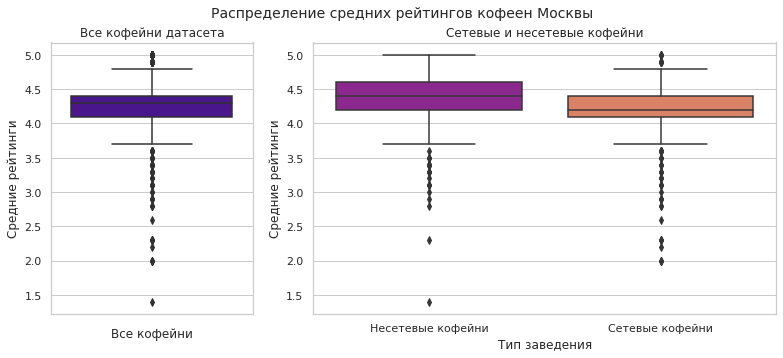

In [134]:
grid = plt.GridSpec(1, 3, wspace=0.3, hspace=0.1)

fig, ax = plt.subplots(1, 3, sharey='row', figsize=(13,5))

ax1 = plt.subplot(grid[0, 0])
ax2 = plt.subplot(grid[0, 1:])

ax1.set_title('Все кофейни датасета')
ax2.set_title('Сетевые и несетевые кофейни')

sns.boxplot(y='rating', data=coffee_houses_df, color = '#46039f', ax=ax1)
sns.boxplot(y='rating', data=coffee_houses_df, x='chain', palette='plasma', ax=ax2)

ax1.set_xlabel('Все кофейни')
ax1.set_ylabel('Средние рейтинги', fontsize=12)

ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Средние рейтинги', fontsize=12)

# Use the pyplot interface to change just one subplot
plt.sca(ax2)
plt.xticks([0,1], ['Несетевые кофейни', 'Сетевые кофейни'],  fontsize=11)

plt.suptitle('Распределение средних рейтингов кофеен Москвы', fontsize=14);

- Средние рейтинги кофеен варьируются от 1.4 до 5 (тогда как объектов по всему датафрейму - от 1 до 5).
- При этом значения до 3.7 и от 4.8 являются выбросами, или крайне нетипичными, редко встречающимися оценками (что совпадает с распределением по датафрейму в целом).


- В целом по выборке среднее значение рейтингов кофеен (верхняя граница второго квартиля) составляет 4.3. При этом для несетевых кофеен среднее значение рейтингов равно 4.4, а для сетевых - 4.2.
- Средние оценки несетевых кофеен в целом несколько выше, чем оценки сетевых кофеен.
- Оценки 4.9 и 5.0 являются типичными для несетевых кофеен (входят в 4-ый квартиль), но являются выбросами для сетевых кофеен.




Посмотрим, как рейтинги кофеен варьируются по административным округам.

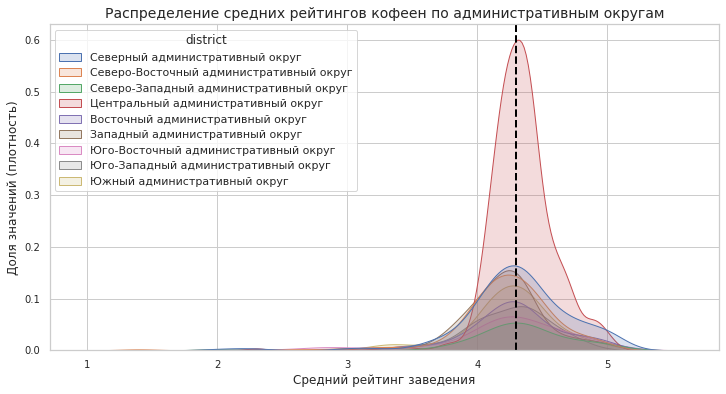

In [135]:
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")

sns.kdeplot(data=coffee_houses_df, x='rating', hue = 'district', fill=True, alpha=0.2)

plt.title('Распределение средних рейтингов кофеен по административным округам', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Средний рейтинг заведения', fontsize=12)
plt.ylabel('Доля значений (плотность)', fontsize=12)


# Добавим на график медианное значение среднего рейтинга по всему датасету.
xmedian = np.median(data['rating'])
plt.axvline(xmedian, c='black', linewidth = 2, linestyle = '--');

# График не окарашен в палитру plasma, т.к. это делает его менее информативным.

- Данные Северному административному округу содержат больше крайних положительных оценок, чем данные по другим округам. 
- Данные по Центральному округу сгруппированы на графике распределения наиболее компактно. Оценки кофеен в этом округе более однозначны, большая часть из них попадает в диапазон от 4 до 4.5.

Кроме того, в данных по округам есть выбросы ниже 3.7, но на данном типе графика не возможно четко проследить, к каким именно округам они относятся. Проверим с помощью другого типа графика.

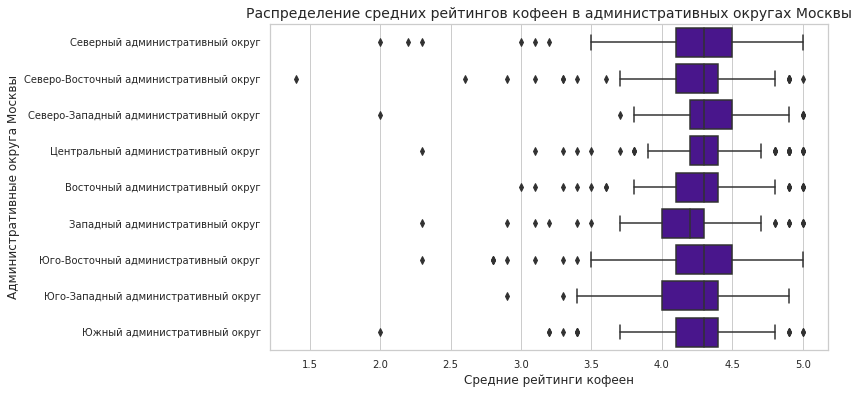

In [136]:
plt.figure(figsize=(10,6))

sns.boxplot(x=coffee_houses_df["rating"], y=coffee_houses_df['district'], color = '#46039f')

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.title('Распределение средних рейтингов кофеен в административных округах Москвы', fontsize=14)
plt.ylabel('Административные округа Москвы', fontsize=12)
plt.xlabel('Средние рейтинги кофеен', fontsize=12);

- Медианные значения рейтингов кофеен по округам во всех административных округах Москвы, кроме Западного, равны и составляют 4.3.
- В Западном округе медианный рейтинг кофеен равен 4.2.
- В данных о рейтингах по округам достаточно много выбросов: единичные невысокие оценки работы кофеен характерны для всех округов.

In [137]:
#ratings_by_district = coffee_houses_df.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending = False)
#ratings_by_district

# Choropleth по данным не построен, потому что при такой низкой вариативности медиан он малоинформативен.

#### Стоимость чашки капучино

Изучим, на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни и почему.

Прежде всего, посмотрим на общее распределение средней стоимости чашки капучино по кофейням, а также на стоимость чашки капучино в зависимости от принадлежности к сети заведений.

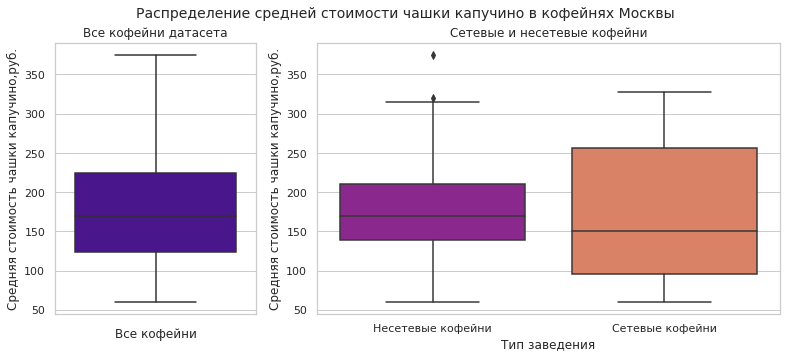

In [138]:
grid = plt.GridSpec(1, 3, wspace=0.3, hspace=0.1)

fig, ax = plt.subplots(1, 3, sharey='row', figsize=(13,5))

ax1 = plt.subplot(grid[0, 0])
ax2 = plt.subplot(grid[0, 1:])

ax1.set_title('Все кофейни датасета')
ax2.set_title('Сетевые и несетевые кофейни')

sns.boxplot(y='middle_coffee_cup', data=coffee_houses_df, color = '#46039f', ax=ax1)
sns.boxplot(y='middle_coffee_cup', data=coffee_houses_df, x='chain', palette='plasma', ax=ax2)

ax1.set_xlabel('Все кофейни')
ax1.set_ylabel('Средняя стоимость чашки капучино,руб.', fontsize=12)

ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Средняя стоимость чашки капучино,руб.', fontsize=12)

# Use the pyplot interface to change just one subplot
plt.sca(ax2)
plt.xticks([0,1], ['Несетевые кофейни', 'Сетевые кофейни'])

plt.suptitle('Распределение средней стоимости чашки капучино в кофейнях Москвы', fontsize=14);

Посмотрим на числовые значения распределений.

In [139]:
coffee_houses_df['middle_coffee_cup'].describe()

count    520.000000
mean     172.396154
std       65.792053
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [140]:
coffee_houses_df.groupby('chain')['middle_coffee_cup'].describe().reset_index()

,chain,count,mean,std,min,25%,50%,75%,max
0,0,257.0,177.412451,51.666459,60.0,139.0,170.0,210.0,375.0
1,1,263.0,167.494297,76.925208,60.0,95.0,150.0,256.0,328.0


- Средняя стоимость чашки капучино в кофейнях по выборке в целом варьируется от 60 до 375 рублей.   
  Медианное значение составляет 169 рублей, а среднее - 172 рубля.

- Средняя стоимость чашки капучино в несетевых кофейнях варьируется от 60 до 375 рублей.  
  Медианное значение составляет 170 рублей, а среднее - 177 рублей.
    
- Средняя стоимость чашки капучино в сетевых кофейнях варьируется от 60 до 328 рублей.   
  Медианное значение составляет 150 рублей, а среднее - 167 рублей.
  
Таким образом, в среднем кофе в сетевой кофейне обойдется клиенту дешевле, чем в сетевой.

Посмотрим, как варьируется средняя стоимость чашки капучино в зависимости от района города.

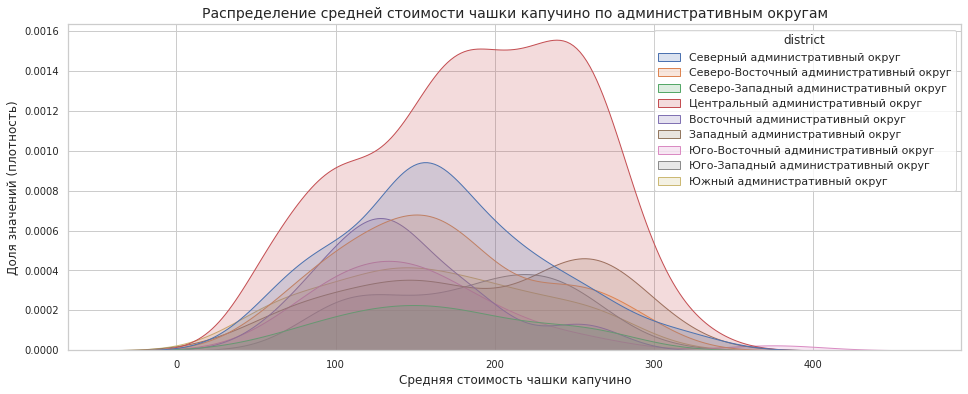

In [142]:
plt.figure(figsize=(16,6))
sns.set(style="whitegrid")

sns.kdeplot(data=coffee_houses_df, x='middle_coffee_cup', hue = 'district', fill=True, alpha=0.2)

plt.title('Распределение средней стоимости чашки капучино по административным округам', fontsize=14)

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.xlabel('Средняя стоимость чашки капучино', fontsize=12)
plt.ylabel('Доля значений (плотность)', fontsize=12)

# Добавим на график медианное значение среднего рейтинга по всему датасету.
xmedian = np.median(coffee_houses_df['middle_coffee_cup'])
plt.axvline(xmedian, c='black', linewidth = 2, linestyle = '--');

# График не окарашен в палитру plasma, т.к. это делает его менее информативным.

- Стоимость чашки капучино в Центральном административном округе имеет самый большой разброс значений. Вероятно, здесь расположены кофейни, ориентированные на разные сегменты клиентов - как дешевые, так и премиальные.
- Среднее значение стоимости чашки капучино в Центральном, Западном и Юго-Западном округах, вероятно, выше, чем в остальных округах города.
- Среднее значение стоимости чашки капучино в Восточном округе, наоборот, несколько ниже.

Проверим эти выводы с помощью графика другого типа.

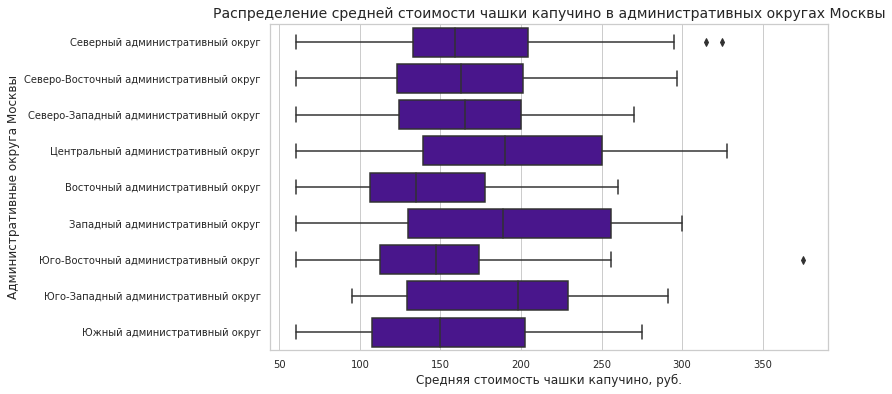

In [143]:
plt.figure(figsize=(10,6))

sns.boxplot(x=coffee_houses_df["middle_coffee_cup"], y=coffee_houses_df['district'], color = '#46039f')

plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.title('Распределение средней стоимости чашки капучино в административных округах Москвы', fontsize=14)
plt.ylabel('Административные округа Москвы', fontsize=12)
plt.xlabel('Средняя стоимость чашки капучино, руб.', fontsize=12);

- Как мы видим, самый высокий разброс средних цен на чашку капучино характерен для кофеен Центрального округа.
- Наименьший разброс средних цен на чашку капучино характерен для кофеен Восточного и Юго-Восточного административных округов.
- Интересен Юго-Западный административный округ: это единственный округ, где минимальная цена выше общей планки в 60 рублей и составляет 90 рублей.

С точки зрения медианных значений средних цен можно выделить следующие 3 кластера:
- Центральный, Западный и Юго-Западный округа - локации с наиболее высокой медианной стоимостью,
- Северный, Северо-Восточный и Северо-Западный округа - локации со средним ценником по медиане,
- Восточный, Юго-Восточный, Южный округа - локации с наиболее низкой медианной стоимостью.

Посмотрим на конкретные значения медиан ниже.

In [144]:
middle_coffee_cup_by_district = coffee_houses_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending = False)
middle_coffee_cup_by_district

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


- Наиболее высокое медианное значение средних цен на чашку капучино характерно для кофеен Юго-Западного административного округа. Оно составляет 198 руб.
- Наиболее низкое -  для кофеен Восточного административного округа. Оно составляет 135 руб.

Что касается 3 ранее выделенных нами кластеров:
- Центральный, Западный и Юго-Западный округа - локации с наиболее высокой медианной стоимостью чашки капучино: от 189 до 198 рублей.
- Северный, Северо-Восточный и Северо-Западный округа - локации со средним ценником по медиане: от 159 до 165 рублей.
- Восточный, Юго-Восточный, Южный округа - локации с наиболее низкой медианной стоимостью: от 135 до 150 рублей.

Посмотрим на медианные значения средней стоимости чашки капучино по округам на карте.

In [145]:
# Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

# Загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup_by_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m)

# выводим карту
m

- Наиболее высокая средняя (медианная) стоимость чашки капучино характерна для заведений центра, запада и юго-запада столицы.
- Далее следуют заведения географического севера Москвы, включающего Северо-Западный, Северный и Северо-Восточный административные округа.
- Несколько ниже средняя стоимость чашки капучино на юге и юго-востоке города, а наиболее низка - в Восточном административном округе.

Посмотрим, какова медианная стоимость чашки капучино по округам только для несетевых заведений.

In [146]:
middle_coffee_cup_by_district = coffee_houses_df.query('chain==0').groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending = False)
middle_coffee_cup_by_district

,district,middle_coffee_cup
5,Центральный административный округ,195.0
7,Юго-Западный административный округ,190.5
8,Южный административный округ,170.0
1,Западный административный округ,167.5
2,Северный административный округ,165.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
6,Юго-Восточный административный округ,150.0
0,Восточный административный округ,134.5


Если рассматривать средние цены несетевых заведений отдельно, то ситуация несколько изменяется:

- Наиболее высокое медианное значение средних цен на чашку капучино в подвыборке несетевых заведений характерно для кофеен Центрального административного округа. Оно составляет 195 руб.
- Также достаточно высоки цены в несетевых кофейнях Юго-Западного округа. Медианное значение средних цен на чашку капучино составляет 190.5 рублей.
- Наиболее низкое медианное значение стоимости чашки капучино по-прежнему характерно для кофеен Восточного административного округа. Оно составляет 134.5 руб.

Посмотрим, какова медианная стоимость чашки капучино по округам только для сетевых заведений.

In [147]:
middle_coffee_cup_by_district = coffee_houses_df.query('chain==1').groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending = False)
middle_coffee_cup_by_district

,district,middle_coffee_cup
1,Западный административный округ,225.0
7,Юго-Западный административный округ,199.5
5,Центральный административный округ,177.5
4,Северо-Западный административный округ,172.0
3,Северо-Восточный административный округ,162.0
0,Восточный административный округ,145.0
2,Северный административный округ,140.0
6,Юго-Восточный административный округ,130.0
8,Южный административный округ,109.5


Посмотрим, как взаимосвязаны рейтинг и средняя стоимость чашки капучино в сетевых и несетевых кофейнях.

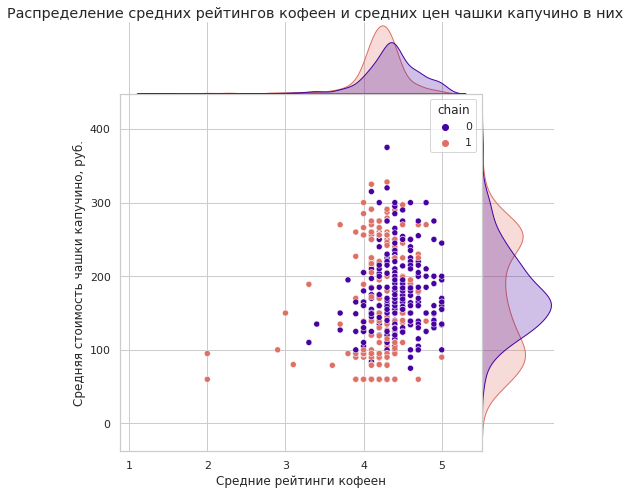

In [148]:
graph = sns.jointplot(x="rating", y="middle_coffee_cup", hue='chain', kind='scatter',
              data=coffee_houses_df, palette=['#46039f', '#de7065ff'],
              height=7,ratio=5,space=0)

graph.set_axis_labels(ylabel='Средняя стоимость чашки капучино, руб.', xlabel='Средние рейтинги кофеен')

graph.fig.subplots_adjust(top=0.95) # Reduce plot to make room for title
graph.fig.suptitle("Распределение средних рейтингов кофеен и средних цен чашки капучино в них");

In [149]:
coffee_houses_df['middle_coffee_cup'].corr(coffee_houses_df['rating'])

0.14326217132743818

- В целом по выборке нет зависимости оценок кофеен от их ценового сегмента. Коэфиициент корреляции равен 0.14, что означает отсутствие связи между показателями. 
- Нижние выбросы в оценках (оценки ниже 3.7) чаще относятся к сетевым кофейням с ценником до 200 рублей. Верхние выбросы (оценки 4.9 и 5.0) - к несетевым кофейням с ценником от 100 рублей. Однако, поскольку эти наблюдения единичны, нельзя делать выводы на их основе.
- Даже если мы исключим выбросы, средние оценки несетевых кофеен несколько лучше - их график распределения больше смещен в сторону высоких оценок, по сравнению с графиком распределения оценок сетевых кофеен.
- Что касается средней стоимости чашки капучино, интересно отметить, что большая часть цен в несетевых кофейнях сконцентрирована в одном пике - от 100 до примерно 220 руб., тогда как цены сетевых кофеен имеют 2 пика - примерно в районе 60-120 рублей и 200-300 рублей. То есть, четко видна ориентированность различных сетей на разные сегменты клиентов.

#### Вывод

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, хотя кофеен в больших городах уже достаточно. Определим, осуществима ли мечта клиентов.

Из изначального запроса на "крутую и доступную, как «Central Perk», кофейню" мы можем сделать вывод, что особое внимание при анализе стоит уделить несетевым заведениям среднего ценового сегмента.

<b>В рамках исследования рынка кофеен мы отметили следующие его особенности</b>:

1) <b>Кофейни составляют 16.8% рынка заведений общественного питания г. Москвы</b>.

- В исходном датасете содержались данные о 1413 кофейнях. После того, как в процессе предобработки данных мы привели сети к единым для них категориям, число кофеен увеличилось до 1415, что составляет 16.8% от общего числа объектов в датафрейме.

- <b>Кофейни входят в тройку лидирующих категорий заведений. Большую долю рынка, чем кофейни, имеют только кафе (28.6% рынка) и рестораны (24.0%)</b>. Доля других категорий составляет менее 10%. Подробнее см. раздел 4.1.

Таким образом, <b>в идее основателей фонда есть смысл – кофейни являются перспективным сегментом на рынке общественного питания. На их услуги есть достаточный спрос</b>.

Осталось разобраться, какую локацию, тип заведения (круглосуточное / некруглосуточное) и ценовую политику мы можем порекомендовать заказчику. Эти аспекты мы осветим в следующих подпунктах.


2) <b>Больше всего кофеен (429 объектов,  или 30% от всех кофеен) расположено в Центральном административном округе</b>, что более чем в 2 раза превышает число кофеен в каждом из других округов Москвы. Вероятно, это обусловлено большей проходимостью и большей концентрацией активностей, предполагающих потребление кофе:
- Утром перед работой - для офисных работников, поскольку многие офисы расположены в центре;
- На вынос при прогулках по центру города – для туристов, а также для горожан в выходные;
- Днем – для деловых встреч (центр более удобен для встреч по сравнению с окраинами);
- Вечером  - для встреч с друзьями в удобной для всех локации (центр более удобен для встреч по сравнению с окраинами).

Таким образом, <b>именно Центральный административный округ Москвы стоит рассматривать для открытия кофейни в первую очередь</b>.

3) В других округах Москвы, помимо Центрального, доля кофеен от их общего числа в городе не так значительна:
- Второе место по числу кофеен занимает Северный административный округ (14% кофеен от их общего числа);
- Северо-Восточный и Западный округа включают по 11% кофеен, Южный – 9%;
- Далее следуют Восточный (7%), Юго-Западный (7%) и Юго-Восточный (6%) округа;
- Наименьшее количество кофеен (63 объекта, или 4% от всех кофеен) расположено в Северо-Западном административном округе.

4) <b>Доля круглосуточных кофеен составляет 5.2%, доля некруглосуточных – 94.8%</b>.

- Доля круглосуточных кофеен несколько меньше, чем доля круглосуточных объектов всех типов в датафрейме в целом (последняя составляет 8.7%).
- Более того, как мы помним из раздела 4.13, доля круглосуточных объектов в категории кофеен является одной из самых низких относительно других типов заведений. Продублируем информацию из раздела 4.13 ниже:
        ◦ Наиболее высока доля круглосуточных заведений в категории фастфуда (25.9%). 
        ◦ Далее следуют кафе с 10.7% круглосуточных заведений и булочные с 8.5% круглосуточных заведений. 
        ◦ Доля круглосуточных баров и пабов составляет 6.7%, а ресторанов - 6.4%. 
        ◦ Доля круглосуточных кофеен равна 5.2%, пиццерий - 4.9%. 
        ◦ Меньше всего круглосуточных объектов в категории столовых - 2.9%. 
        
Очевидно, что <b>в категории кофеен нет круглосуточного спроса, как и в категориях пиццерий и столовых (в отличие от фастфуда, где спрос есть круглосуточно). Таким образом, мы можем рекомендовать инвесторам не открывать круглосуточный объект</b>.

На случай, если инвесторам будет интересен именно круглосуточный формат, посмотрим, как круглосуточные кофейни распределены по административным округам Москвы:

- Наибольший процент круглосуточных кофеен характерен для Юго-Западного административного округа (12.2%).
- Далее следуют Западный и Восточный административные округа (по 6.7% круглосуточных кофеен), а также Центральный округ (6.1% круглосуточных кофеен). 
- Наименьшая доля круглосуточных кофеен характерна для Южного административного округа (0.1%), также их доля крайне низка в  Северном административном округе (2.6%). 
Там, где круглосуточных объектов больше, на круглосуточные объекты, вероятно, существует некий локальный ночной спрос. А значит, открывать новую круглосуточную кофейню логично именно там – в Юго-Западном административном округе. При этом стоит провести дополнительное исследование, в каких именно точках ЮЗАО этот спрос генерируется. 

5) В целом по выборке <b>среднее (медианное) значение рейтингов кофеен составляет 4.3. При этом для несетевых кофеен среднее значение рейтингов равно 4.4, а для сетевых - 4.2 </b>.  Вероятно, несетевые кофейни предоставляют клиентам несколько более высокий уровень сервиса, чем сетевые.

- В целом средние рейтинги кофеен варьируются от 1.4 до 5 (тогда как объектов по всему датафрейму - от 1 до 5).  При этом значения до 3.7 и от 4.8 являются выбросами, или крайне нетипичными, редко встречающимися оценками (что совпадает с распределением по датафрейму в целом).
- Оценки 4.9 и 5.0 являются типичными для несетевых кофеен (входят в 4-ый квартиль), но являются выбросами для сетевых кофеен.
- Медианные значения рейтингов кофеен по округам во всех административных округах Москвы, кроме Западного, равны и составляют 4.3.  В Западном округе медианный рейтинг кофеен равен 4.2 – возможно, публика там несколько более притязательна.


6) Средняя стоимость чашки капучино в кофейнях по выборке в целом варьируется от 60 до 375 рублей. Медианное значение составляет 169 рублей, а среднее - 172 рубля.
- <b>Средняя стоимость чашки капучино в несетевых кофейнях варьируется от 60 до 375 рублей.
Медианное значение составляет 170 рублей, а среднее - 177 рублей</b>.
- Средняя стоимость чашки капучино в сетевых кофейнях варьируется от 60 до 328 рублей.
Медианное значение составляет 150 рублей, а среднее - 167 рублей.

Как мы видим, в сетевых кофейнях чашка капучино обойдется клиенту несколько дешевле, чем в несетевых.

Таким образом, в целом, без учета локации при открытии несетевого заведения стоит ориентироваться на стоимость чашки капучино в 170-177 рублей. 

Также интересно отметить, что на графике распределения значений большая часть цен в несетевых кофейнях сконцентрирована в одном пике - от 100 до примерно 220 руб., тогда как цены в сетевых кофейнях имеют 2 пика - примерно в районе 60-120 рублей и 200-300 рублей. То есть, четко видна ориентированность различных сетей на разные сегменты клиентов. 

7) Рассмотрим, как варьируется средняя стоимость чашки капучино в зависимости от района города.

- Самый высокий разброс средних цен на чашку капучино характерен для кофеен Центрального округа. Вероятно, здесь расположены кофейни, ориентированные на разные сегменты клиентов - как дешевые, так и премиальные.'
- Наименьший разброс средних цен за чашку капучино характерен для кофеен Восточного и Юго-Восточного административных округов.
- Интересен Юго-Западный административный округ: это единственный округ, где минимальная стоимость чашки капучино выше общей планки в 60 рублей и составляет 90 рублей. Именно для  Юго-Западного административного округа характерно наиболее высокое медианное значение цены чашки капучино -  198 руб.
- Наиболее низкое медианное значение цены чашки капучино - 135 руб. - характерно для кофеен Восточного административного округа.
- В целом с точки зрения медианной стоимости чашки капучино мы можем выделить 3 кластера:
     - Центральный, Западный и Юго-Западный округа - локации с наиболее высокой медианной стоимостью чашки капучино: от 189 до 198 рублей. 
     - Северный, Северо-Восточный и Северо-Западный округа - локации со средним ценником по медиане: от 159 до 165 рублей. 
     - Восточный, Юго-Восточный, Южный округа - локации с наиболее низкой медианной стоимостью: от 135 до 150 рублей.  
Если рассматривать средние цены несетевых заведений отдельно, то ситуация несколько изменяется:

- Наиболее высокое медианное значение средних цен на чашку капучино в подвыборке несетевых заведений характерно для кофеен Центрального административного округа. Оно составляет 195 руб. 
- Также достаточно высоки цены в несетевых кофейнях Юго-Западного округа. Медианное значение средних цен на чашку капучино составляет 190.5 рублей. 
- Наиболее низкое медианное значение стоимости чашки капучино по-прежнему характерно для кофеен Восточного административного округа. Оно составляет 134.5 руб. 

Таким образом, <b> если мы задумываемся об открытии несетевой кофейни в наиболее проходимом Центральном округе, средняя стоимость чашки капучино, на которую стоит ориентироваться, может составлять 195 рублей </b>.

8) Нет зависимости оценок кофеен от их ценового сегмента. Коэфиициент корреляции равен 0.14, что означает отсутствие связи между показателями.

- Нижние выбросы в оценках (оценки ниже 3.7) чаще относятся к сетевым кофейням с ценником до 200 рублей. Верхние выбросы (оценки 4.9 и 5.0) - к несетевым кофейням с ценником от 100 рублей. Однако, поскольку эти наблюдения единичны, нельзя делать выводы на их основе.
- В остальном различий в распределениях оценок в зависимости от цен нет.

<b>Рекомендации по результатам исследования</b>:

- Кофейни являются перспективным сегментом на рынке общественного питания. Идея открыть кофейню является оправданной.


- Рекомендуемая локация для открытия кофейни – Центральный административный округ Москвы. Для него характерна большая проходимость и большая концентрация активностей, предполагающих потребление кофе:
    - Утром перед работой - для офисных работников, поскольку многие офисы расположены в центре;
    - На вынос при прогулках по центру города – для туристов, а также для горожан в выходные;
    - Днем – для деловых встреч (центр более удобен для встреч по сравнению с окраинами);
    - Вечером  - для встреч с друзьями в удобной для всех локации.


- При открытии несетевой кофейни в Центральном округе стоит ориентироваться на медианную стоимость чашки капучино в 195 руб. В дальнейшем – если удастся развить сеть массового сегмента – стоимость может быть снижена до медианного значения в 177.5 руб.


- Для Центрального округа характерен самый высокий разброс средних цен на чашку капучино (от 60 до 330 руб.): здесь расположены как дешевые, так и премиальные кофейни. После проработки концепции заведения и выбора целевой аудитории может потребоваться дополнительное исследование цен – с учетом клиентского сегмента.


- В категории кофеен – в отличие, например, от фастфуда - нет круглосуточного спроса. Мы рекомендуем инвесторам не открывать круглосуточный объект. Если же интересен именно такой формат заведения, в качестве локации стоит рассмотреть Юго-Западный административный округ. 


- Медианное значение рейтинга кофеен всех типов составляет 4.3. Для несетевых кофеен оно равно 4.4, а для сетевых - 4.2.  Вероятно, несетевые кофейни предполагают чуть более высокий уровень сервиса, чем сетевые. Это нужно учесть перед запуском проекта. При этом нет зависимости оценок кофеен от их ценового сегмента – ни для сетевых, ни для несетевых объектов.